In [55]:
import pandas as pd

In [56]:
# Load the dataset
file_path = "/content/default of credit card clients.xls"
df = pd.read_excel(file_path, header=1)

In [57]:
# Display basic information about the dataset
df_info = df.info()
df_head = df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_0                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int64
 14  BILL_A

In [58]:
# Define new column names
new_column_names = {
    "ID": "Customer_ID",
    "LIMIT_BAL": "Credit_Limit",
    "SEX": "Gender",
    "EDUCATION": "Education_Level",
    "MARRIAGE": "Marital_Status",
    "AGE": "Age",
    "PAY_0": "Repayment_Status_Sep",
    "PAY_2": "Repayment_Status_Aug",
    "PAY_3": "Repayment_Status_Jul",
    "PAY_4": "Repayment_Status_Jun",
    "PAY_5": "Repayment_Status_May",
    "PAY_6": "Repayment_Status_Apr",
    "BILL_AMT1": "Bill_Amount_Sep",
    "BILL_AMT2": "Bill_Amount_Aug",
    "BILL_AMT3": "Bill_Amount_Jul",
    "BILL_AMT4": "Bill_Amount_Jun",
    "BILL_AMT5": "Bill_Amount_May",
    "BILL_AMT6": "Bill_Amount_Apr",
    "PAY_AMT1": "Payment_Amount_Sep",
    "PAY_AMT2": "Payment_Amount_Aug",
    "PAY_AMT3": "Payment_Amount_Jul",
    "PAY_AMT4": "Payment_Amount_Jun",
    "PAY_AMT5": "Payment_Amount_May",
    "PAY_AMT6": "Payment_Amount_Apr",
    "default payment next month": "Default_Next_Month"
}

# Rename columns
df.rename(columns=new_column_names, inplace=True)

In [59]:
# Display basic information about the dataset
df_info = df.info()
df_head = df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Customer_ID           30000 non-null  int64
 1   Credit_Limit          30000 non-null  int64
 2   Gender                30000 non-null  int64
 3   Education_Level       30000 non-null  int64
 4   Marital_Status        30000 non-null  int64
 5   Age                   30000 non-null  int64
 6   Repayment_Status_Sep  30000 non-null  int64
 7   Repayment_Status_Aug  30000 non-null  int64
 8   Repayment_Status_Jul  30000 non-null  int64
 9   Repayment_Status_Jun  30000 non-null  int64
 10  Repayment_Status_May  30000 non-null  int64
 11  Repayment_Status_Apr  30000 non-null  int64
 12  Bill_Amount_Sep       30000 non-null  int64
 13  Bill_Amount_Aug       30000 non-null  int64
 14  Bill_Amount_Jul       30000 non-null  int64
 15  Bill_Amount_Jun       30000 non-null  int64
 16  Bill

## Data Cleaning and Preparation

In [60]:
# Check for missing values in each column
missing_values = df.isnull().sum()

# Display columns with missing values
missing_values = missing_values[missing_values > 0]

# Print missing value count for each column
print("Missing Values Count:")
print(missing_values)

# Check for any NaN values in the dataset
print("\nAre there any NaN values in the dataset?")
print(df.isna().any().sum())  # Total count of columns that have NaN values

# Get percentage of missing values per column (if any)
missing_percentage = (df.isnull().sum() / len(df)) * 100
print("\nPercentage of missing values per column:")
print(missing_percentage[missing_percentage > 0])  # Only showing columns with missing values

Missing Values Count:
Series([], dtype: int64)

Are there any NaN values in the dataset?
0

Percentage of missing values per column:
Series([], dtype: float64)


In [61]:
# Check for duplicate rows
duplicate_count = df.duplicated().sum()

# Display the count of duplicate records
duplicate_count

0

In [62]:
# Convert Gender, Education Level, and Marital Status to categorical data types
df["Gender"] = df["Gender"].map({1: "Male", 2: "Female"}).astype("category")

df["Education_Level"] = df["Education_Level"].map({
    1: "Graduate School",
    2: "University",
    3: "High School",
    4: "Others"
}).astype("category")

df["Marital_Status"] = df["Marital_Status"].map({
    1: "Married",
    2: "Single",
    3: "Others"
}).astype("category")

# Verify conversion
print(df[["Gender", "Education_Level", "Marital_Status"]].dtypes)

# Display unique values to confirm mapping
for col in ["Gender", "Education_Level", "Marital_Status"]:
    print(f"\nUnique values in {col}: {df[col].unique()}")

Gender             category
Education_Level    category
Marital_Status     category
dtype: object

Unique values in Gender: ['Female', 'Male']
Categories (2, object): ['Female', 'Male']

Unique values in Education_Level: ['University', 'Graduate School', 'High School', NaN, 'Others']
Categories (4, object): ['Graduate School', 'High School', 'Others', 'University']

Unique values in Marital_Status: ['Married', 'Single', 'Others', NaN]
Categories (3, object): ['Married', 'Others', 'Single']


In [63]:
# Get category counts for each categorical column
print("\nCategory Counts:")
for col in ["Gender", "Education_Level", "Marital_Status"]:
    print(f"\n{col} Value Counts:")
    print(df[col].value_counts())


Category Counts:

Gender Value Counts:
Gender
Female    18112
Male      11888
Name: count, dtype: int64

Education_Level Value Counts:
Education_Level
University         14030
Graduate School    10585
High School         4917
Others               123
Name: count, dtype: int64

Marital_Status Value Counts:
Marital_Status
Single     15964
Married    13659
Others       323
Name: count, dtype: int64


In [64]:
# Credit Utilization Ratio
for month in ["Sep", "Aug", "Jul", "Jun", "May", "Apr"]:
    df[f"Credit_Utilization_{month}"] = df[f"Bill_Amount_{month}"] / df["Credit_Limit"]

# Payment to Bill Ratio
for month in ["Sep", "Aug", "Jul", "Jun", "May", "Apr"]:
    df[f"Payment_Ratio_{month}"] = df[f"Payment_Amount_{month}"] / df[f"Bill_Amount_{month}"]

# Monthly Bill Fluctuation
months = ["Sep", "Aug", "Jul", "Jun", "May", "Apr"]
for i in range(len(months) - 1):
    df[f"Bill_Change_{months[i]}_{months[i+1]}"] = df[f"Bill_Amount_{months[i]}"] - df[f"Bill_Amount_{months[i+1]}"]

# Average Bill Amount
df["Average_Bill_Amount"] = df[[f"Bill_Amount_{month}" for month in months]].mean(axis=1)

# Average Payment Amount
df["Average_Payment_Amount"] = df[[f"Payment_Amount_{month}" for month in months]].mean(axis=1)

# Payment Consistency Score
df["Payment_Consistency_Score"] = (df[[f"Payment_Amount_{month}" for month in months]] > 0).sum(axis=1) / 6

# Total Delay Months
df["Total_Delay_Months"] = df[[f"Repayment_Status_{month}" for month in months]].apply(lambda x: sum(x[x > 0]), axis=1)

# Recent Payment History (Indicator for last 3 months)
df["Recent_Payment_Tendency"] = (df[["Repayment_Status_Sep", "Repayment_Status_Aug", "Repayment_Status_Jul"]] <= 0).all(axis=1).astype(int)

# Customer Stability Score
df["Stability_Score"] = (df["Age"] * df["Credit_Limit"]) / (df["Marital_Status"].map({"Married": 2, "Single": 1, "Others": 1}) + 1)

# Display the updated dataset with new features
df.head()

,Customer_ID,Credit_Limit,Gender,Education_Level,Marital_Status,Age,Repayment_Status_Sep,Repayment_Status_Aug,Repayment_Status_Jul,Repayment_Status_Jun,...,Bill_Change_Aug_Jul,Bill_Change_Jul_Jun,Bill_Change_Jun_May,Bill_Change_May_Apr,Average_Bill_Amount,Average_Payment_Amount,Payment_Consistency_Score,Total_Delay_Months,Recent_Payment_Tendency,Stability_Score
0,1,20000,Female,University,Married,24,2,2,-1,-1,...,2413,689,0,0,1284.000000,114.833333,0.166667,4,0,1.600000e+05
1,2,120000,Female,University,Single,26,-1,2,0,0,...,-957,-590,-183,194,2846.166667,833.333333,0.666667,4,0,1.560000e+06
2,3,90000,Female,University,Single,34,0,0,0,0,...,468,-772,-617,-601,16942.166667,1836.333333,1.000000,0,1,1.530000e+06
3,4,50000,Female,University,Married,37,0,0,0,0,...,-1058,20977,-645,-588,38555.666667,1398.000000,1.000000,0,1,6.166667e+05
4,5,50000,Male,University,Married,57,-1,0,-1,0,...,-30165,14895,1794,15,18223.166667,9841.500000,1.000000,0,1,9.500000e+05


In [65]:
# Display basic information about the dataset
df_info = df.info()
df_head = df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 48 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Customer_ID                30000 non-null  int64   
 1   Credit_Limit               30000 non-null  int64   
 2   Gender                     30000 non-null  category
 3   Education_Level            29655 non-null  category
 4   Marital_Status             29946 non-null  category
 5   Age                        30000 non-null  int64   
 6   Repayment_Status_Sep       30000 non-null  int64   
 7   Repayment_Status_Aug       30000 non-null  int64   
 8   Repayment_Status_Jul       30000 non-null  int64   
 9   Repayment_Status_Jun       30000 non-null  int64   
 10  Repayment_Status_May       30000 non-null  int64   
 11  Repayment_Status_Apr       30000 non-null  int64   
 12  Bill_Amount_Sep            30000 non-null  int64   
 13  Bill_Amount_Aug            3000

### Univariate Analysis

<ipython-input-66-500a8cd77dc1>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df, x=col, palette="coolwarm", alpha=0.8)


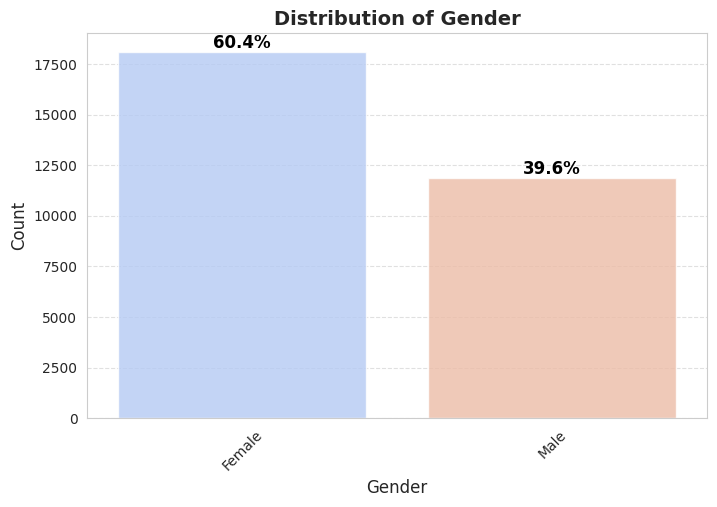

<ipython-input-66-500a8cd77dc1>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df, x=col, palette="coolwarm", alpha=0.8)


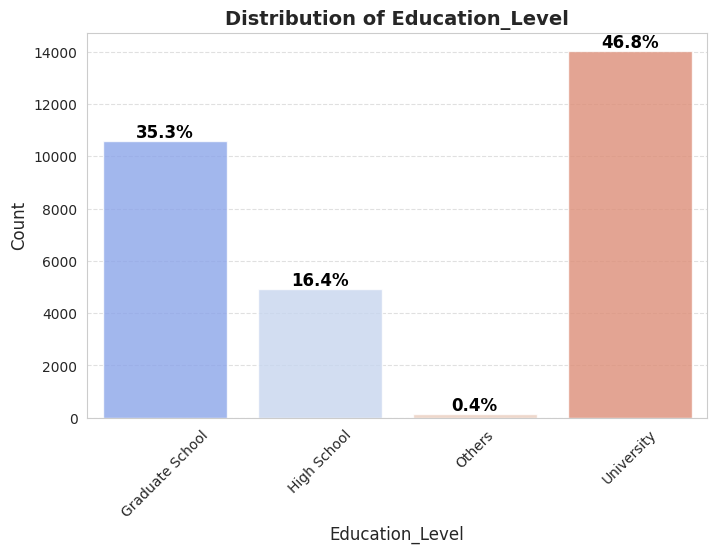

<ipython-input-66-500a8cd77dc1>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df, x=col, palette="coolwarm", alpha=0.8)


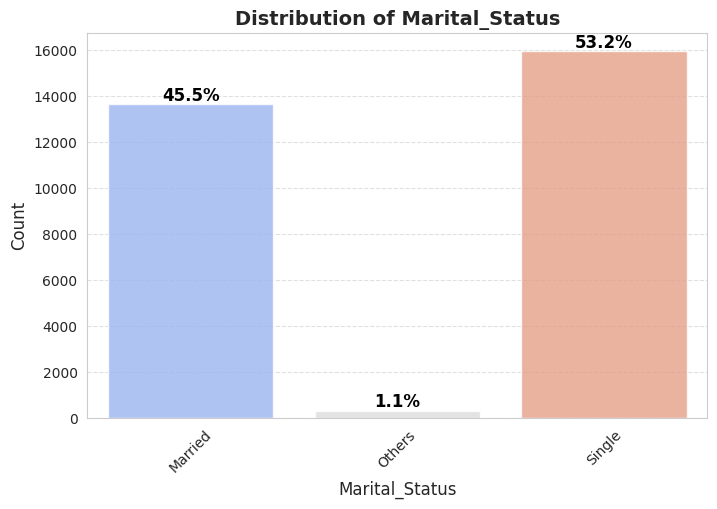

<ipython-input-66-500a8cd77dc1>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=df, x=col, palette="coolwarm", alpha=0.8)


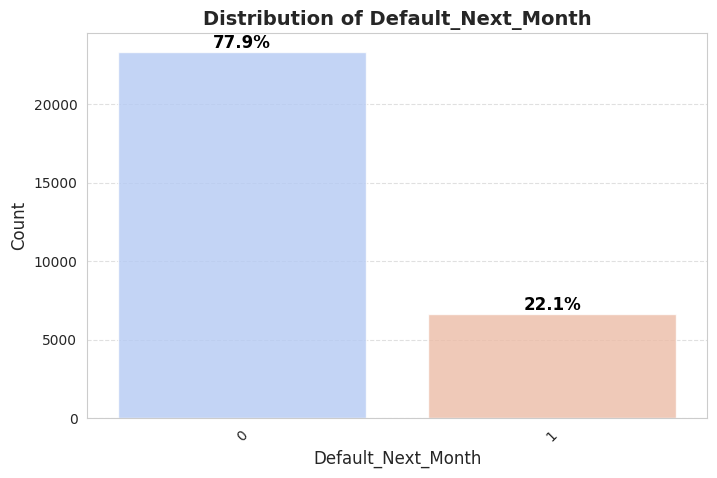

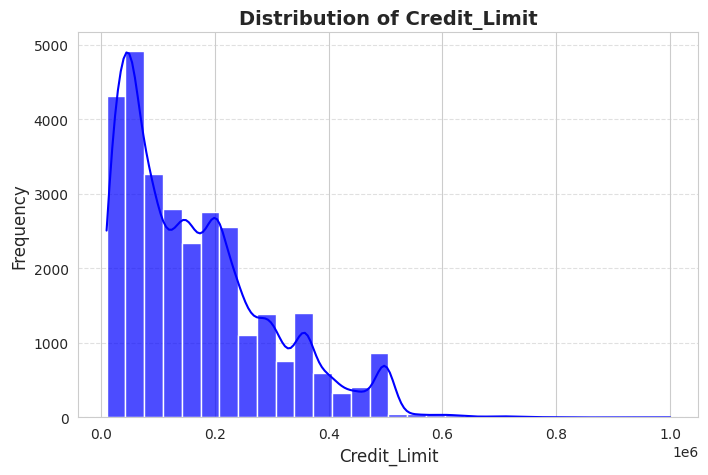

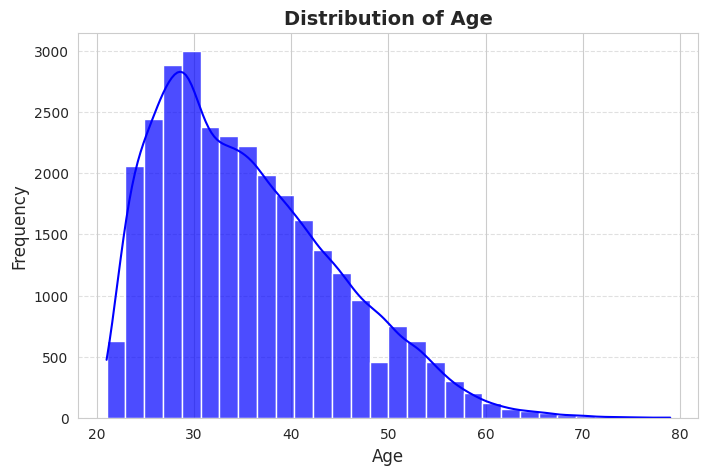

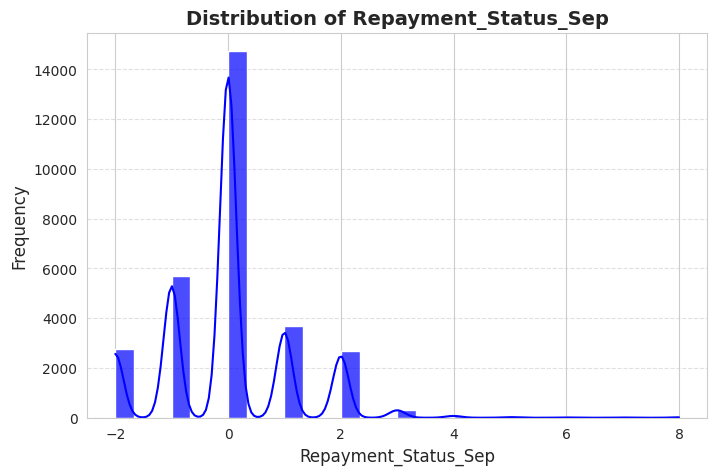

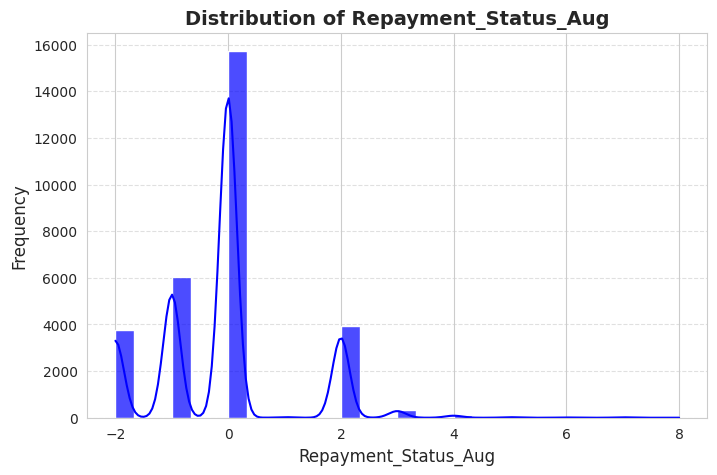

...

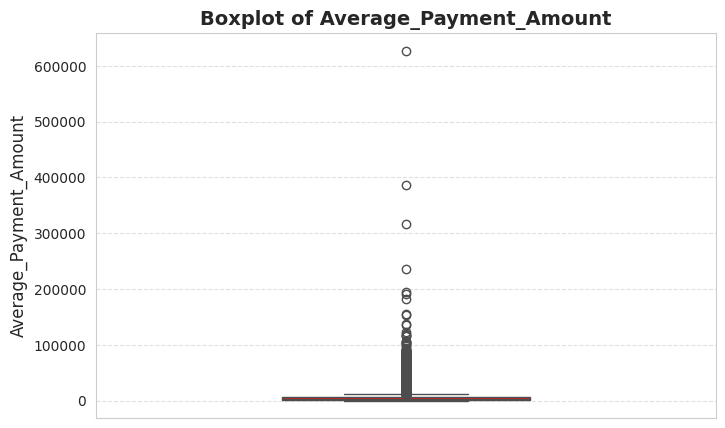

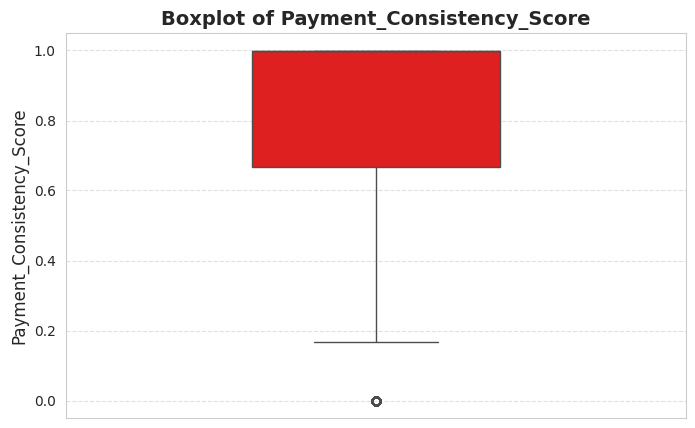

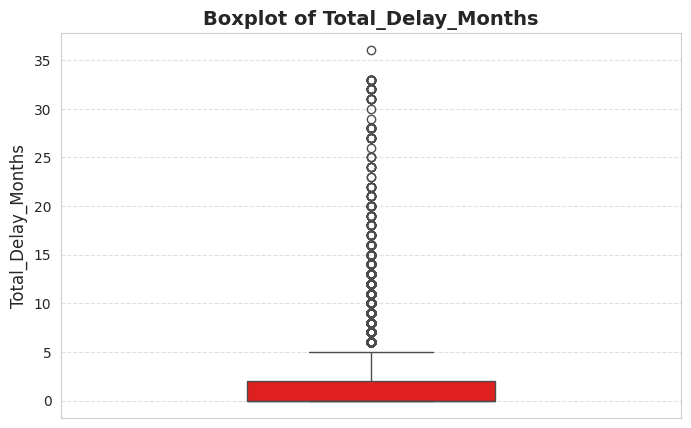

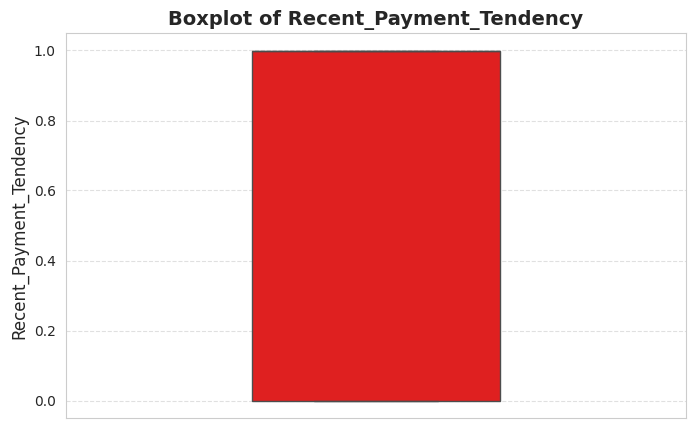

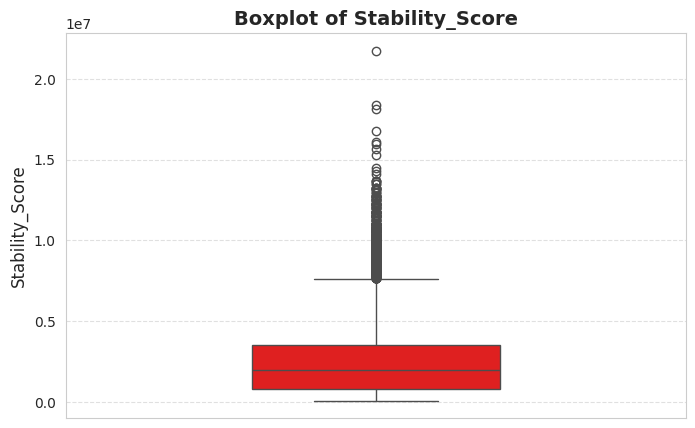

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns

# Identify numerical and categorical columns
categorical_columns = ["Gender", "Education_Level", "Marital_Status", "Default_Next_Month"]
numerical_columns = [col for col in df.columns if col not in categorical_columns and col != "Customer_ID"]

# Set plot style
sns.set_style("whitegrid")

# Bar Charts for Categorical Columns
for col in categorical_columns:
    plt.figure(figsize=(8, 5))
    ax = sns.countplot(data=df, x=col, palette="coolwarm", alpha=0.8)

    # Add percentage labels on bars
    total = len(df)
    for p in ax.patches:
        percentage = f"{100 * p.get_height() / total:.1f}%"
        ax.annotate(percentage, (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=12, color='black', fontweight='bold')

    plt.title(f"Distribution of {col}", fontsize=14, fontweight="bold")
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Count", fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(axis="y", linestyle="--", alpha=0.6)
    plt.show()

# Histograms and KDE Plots for Numerical Columns
for col in numerical_columns:
    plt.figure(figsize=(8, 5))
    sns.histplot(df[col], bins=30, kde=True, color="blue", alpha=0.7)
    plt.title(f"Distribution of {col}", fontsize=14, fontweight="bold")
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.grid(axis="y", linestyle="--", alpha=0.6)
    plt.show()

# Boxplots for Outlier Detection
for col in numerical_columns:
    plt.figure(figsize=(8, 5))
    sns.boxplot(y=df[col], color="red", width=0.4)
    plt.title(f"Boxplot of {col}", fontsize=14, fontweight="bold")
    plt.ylabel(col, fontsize=12)
    plt.grid(axis="y", linestyle="--", alpha=0.6)
    plt.show()

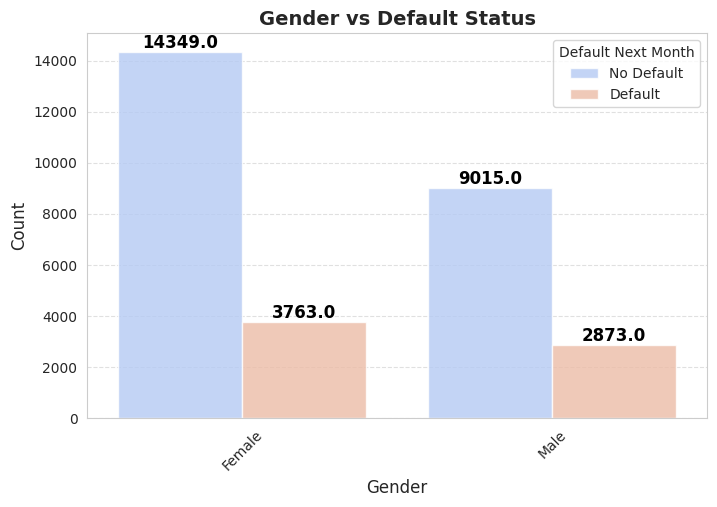

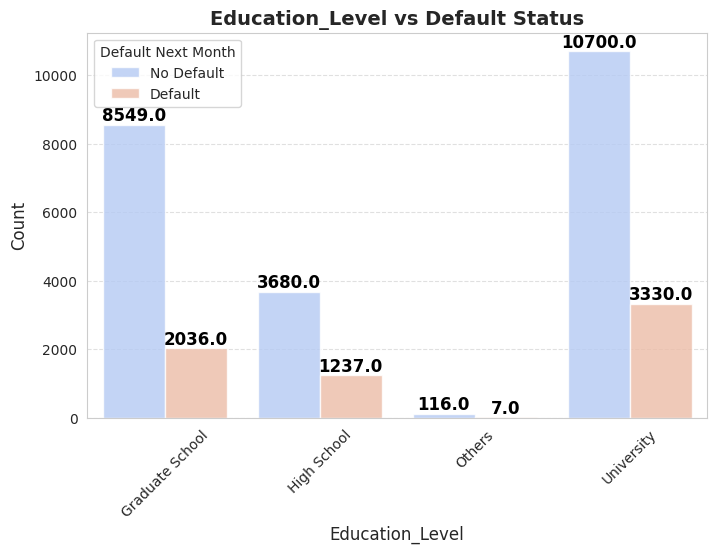

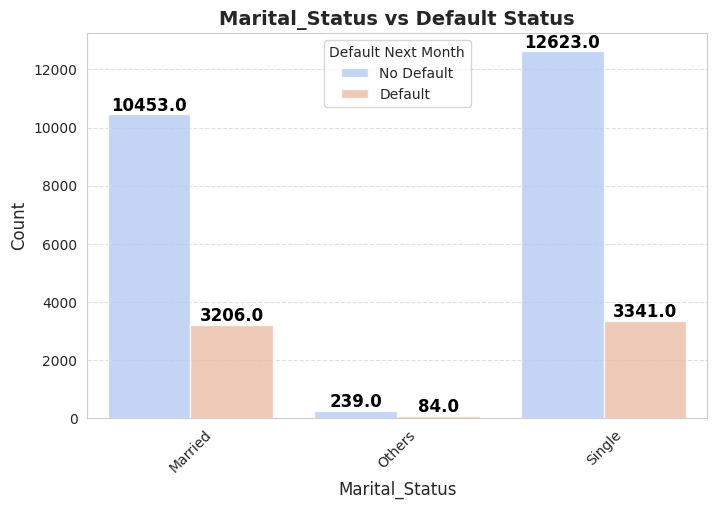

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


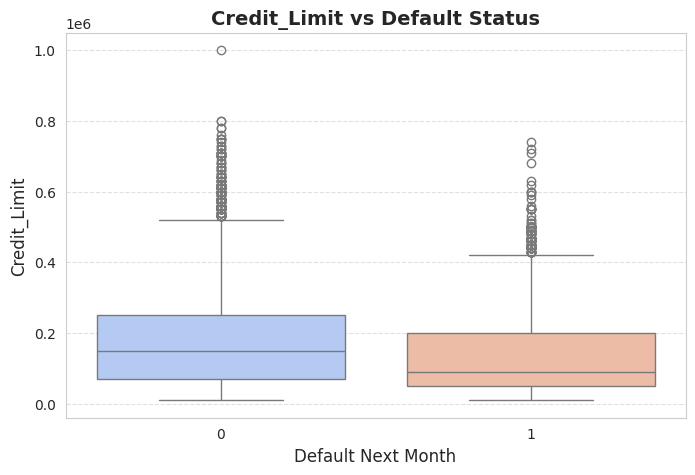

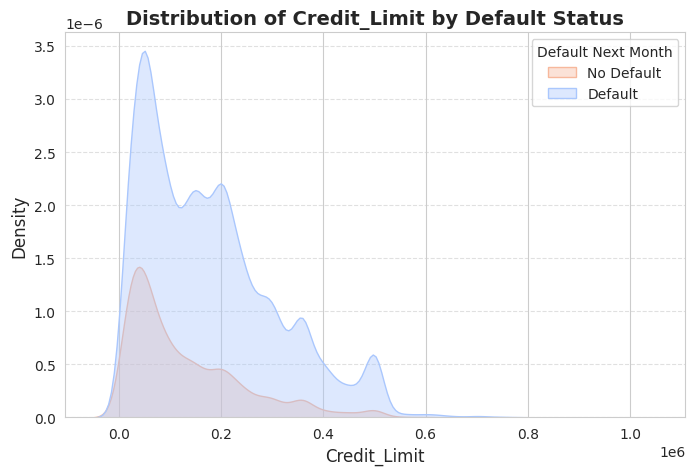

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


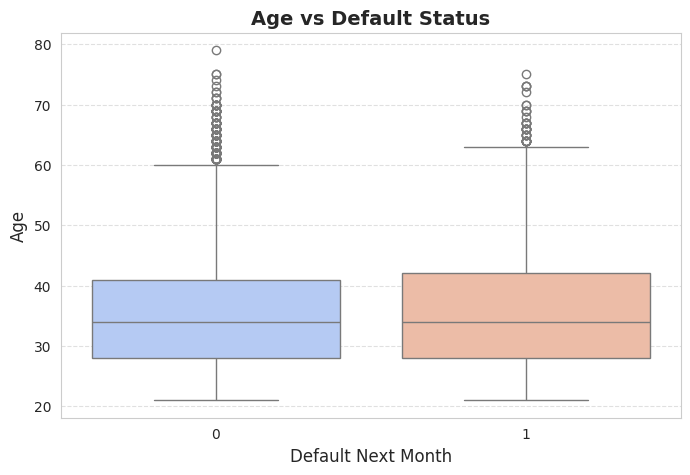

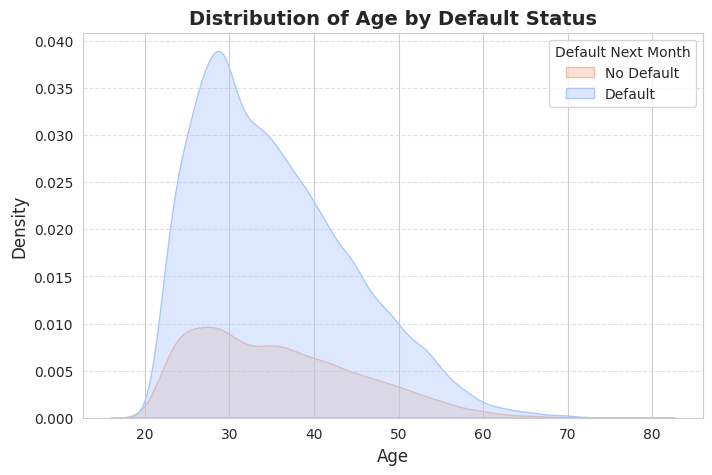

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


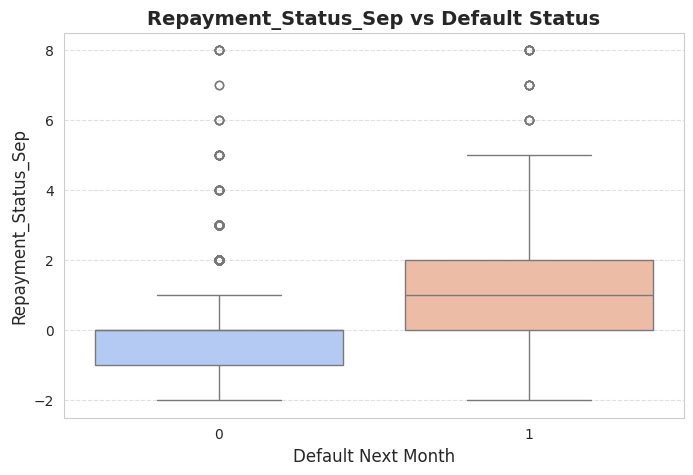

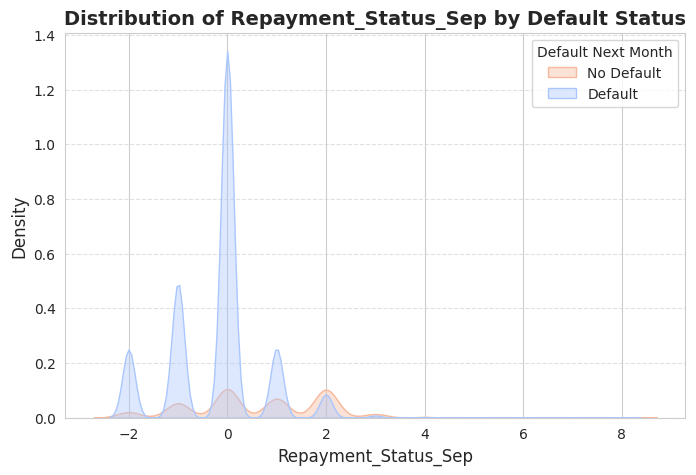

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


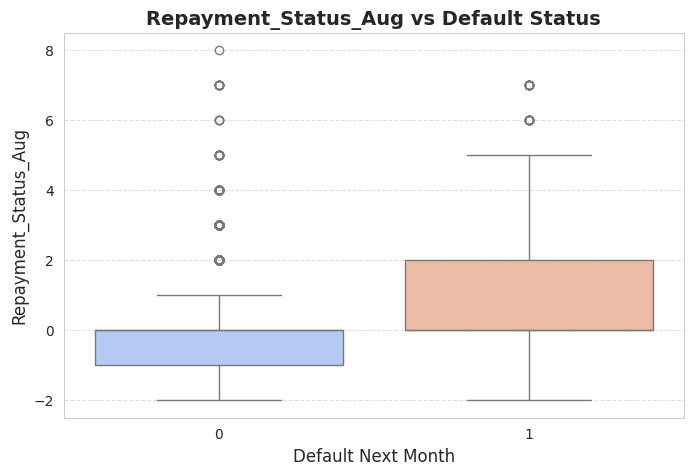

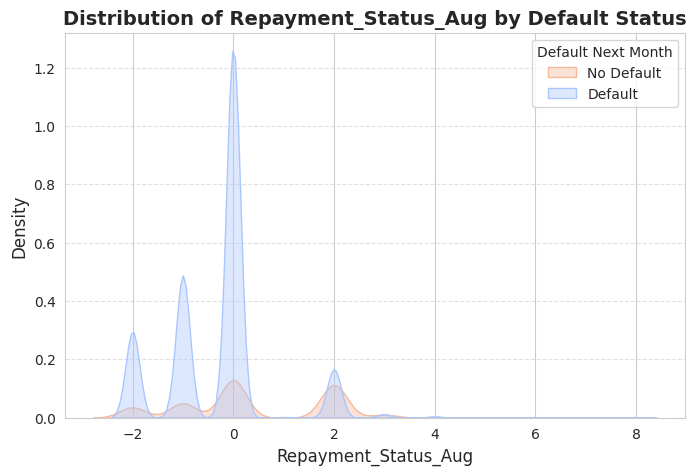

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


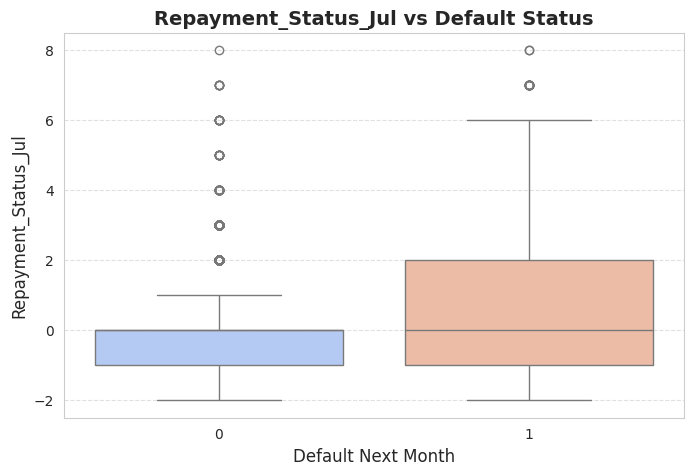

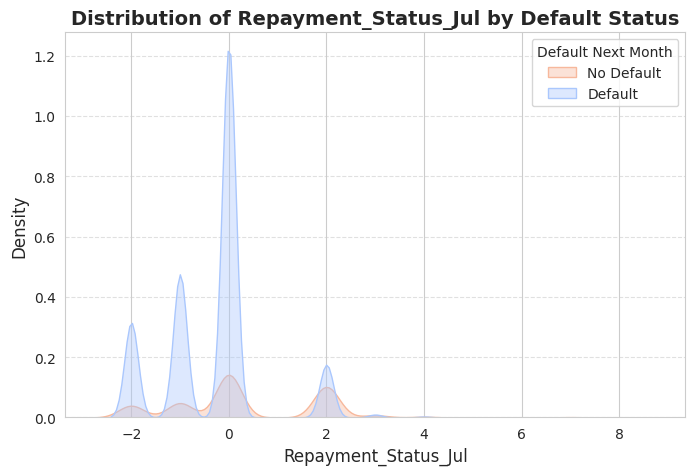

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


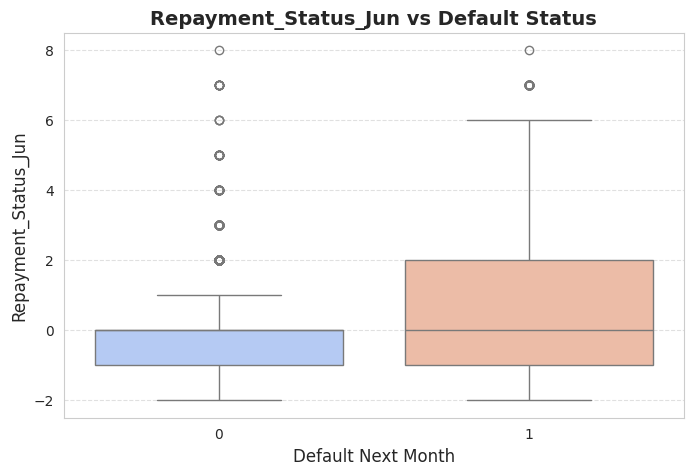

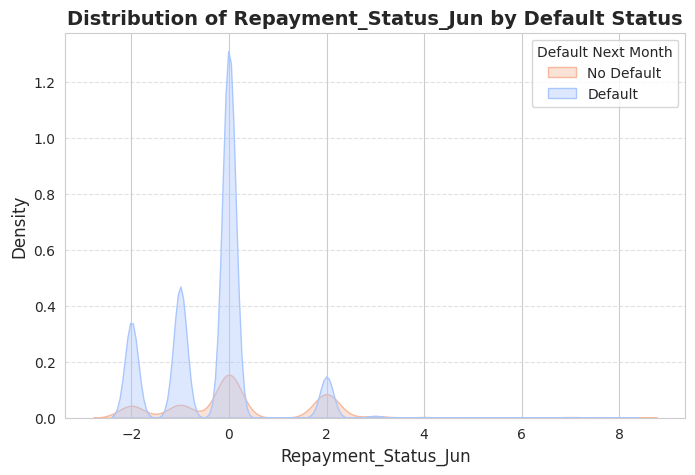

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


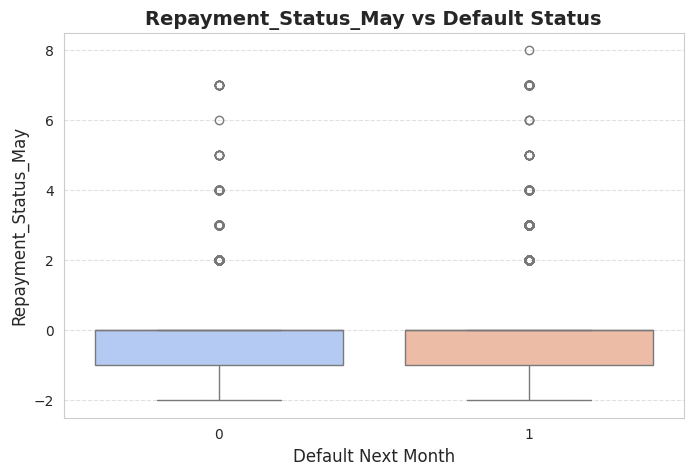

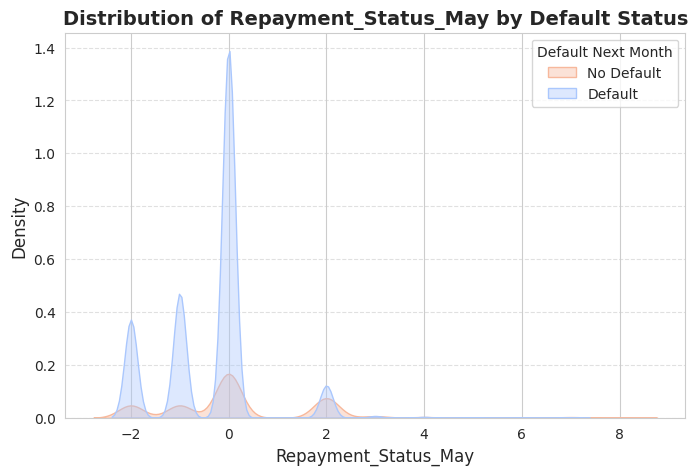

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


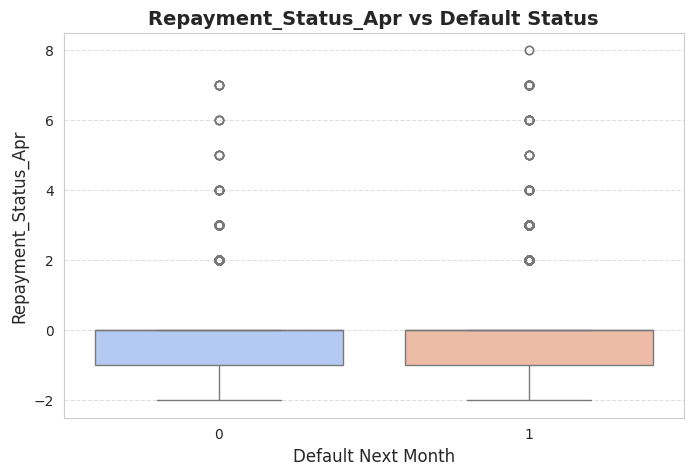

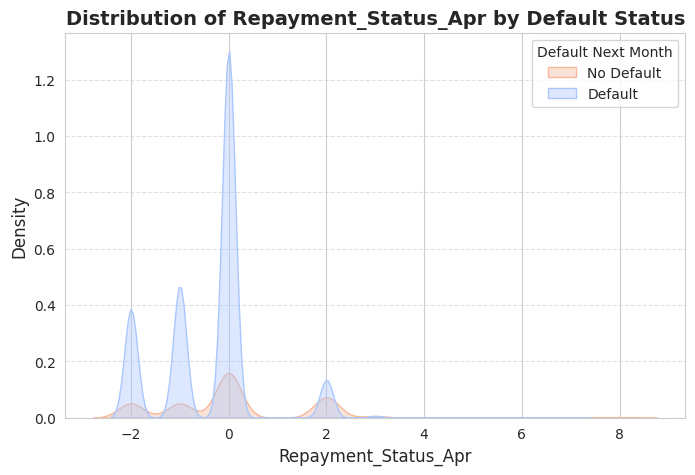

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


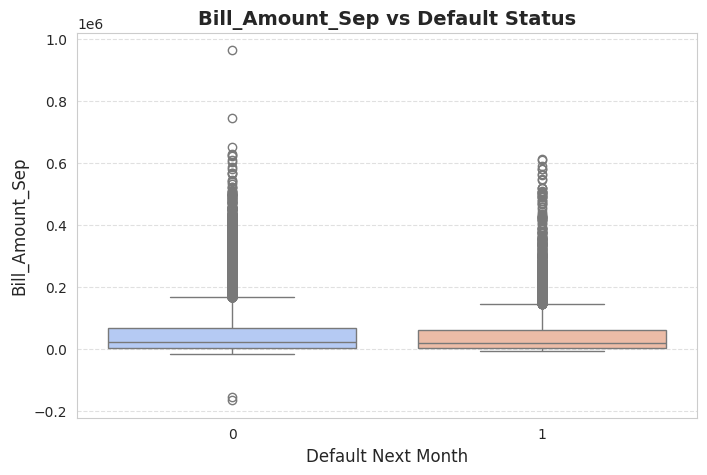

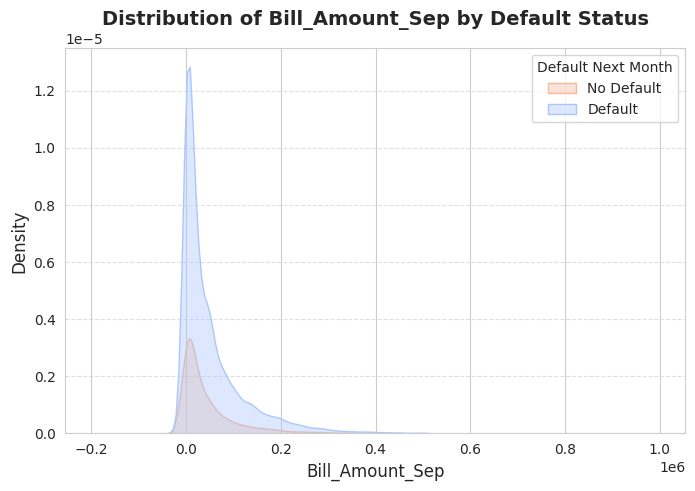

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


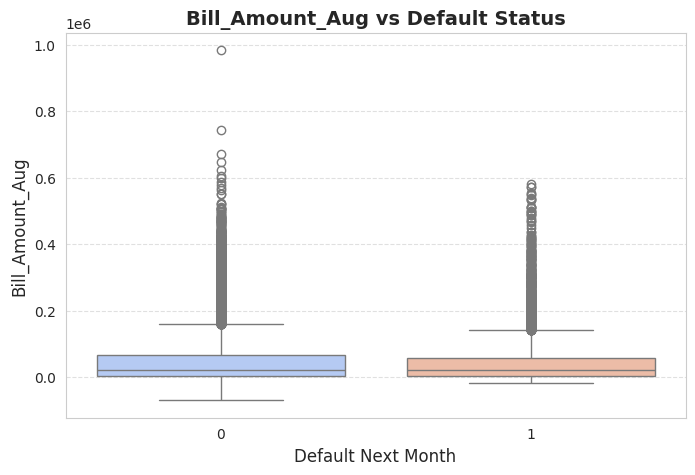

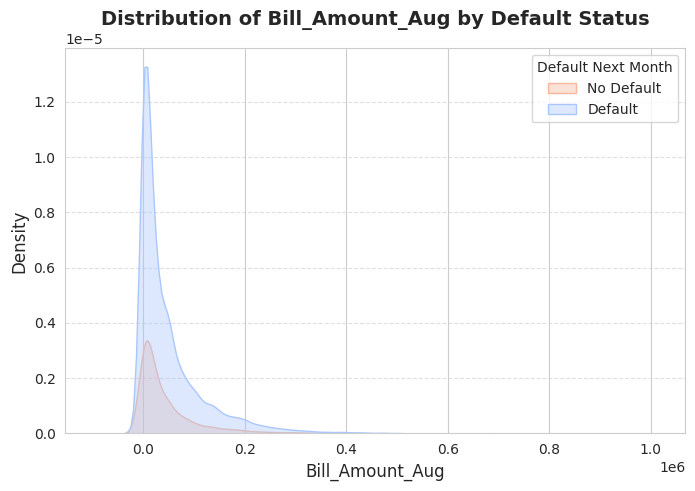

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


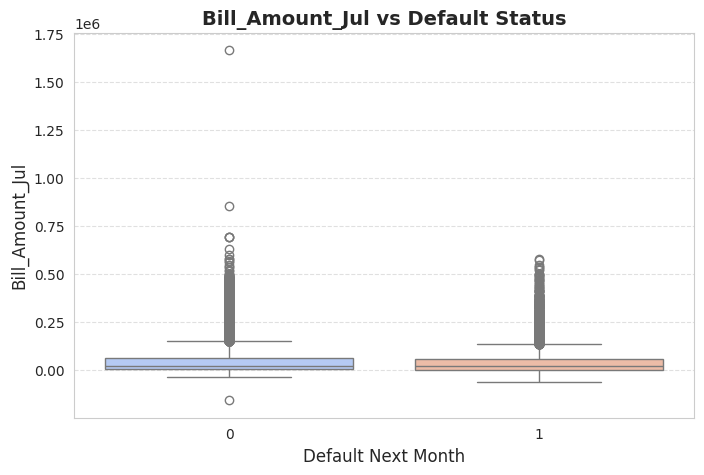

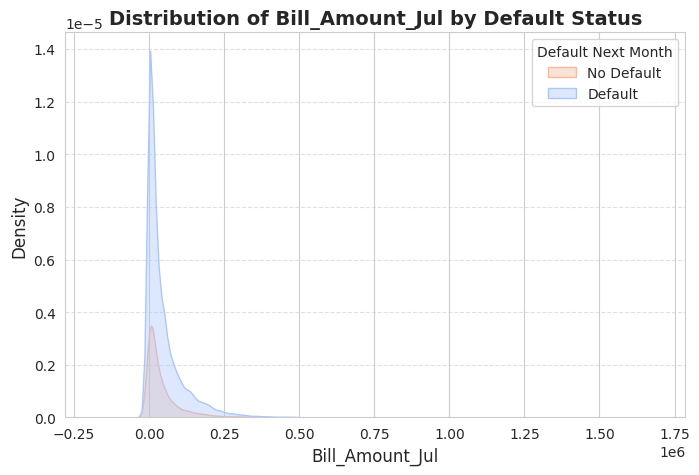

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


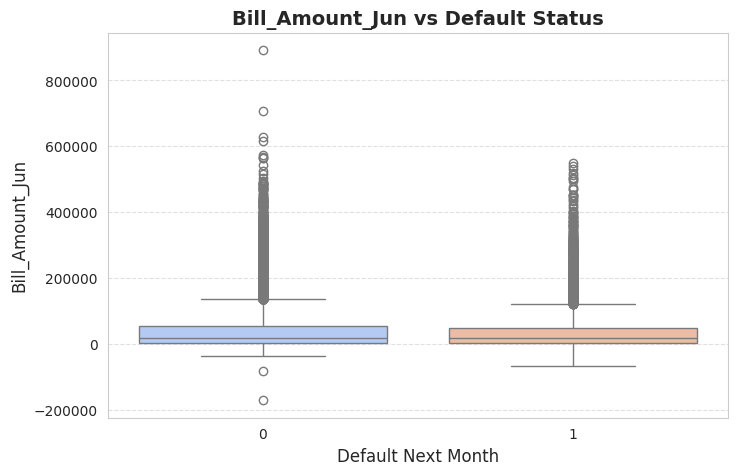

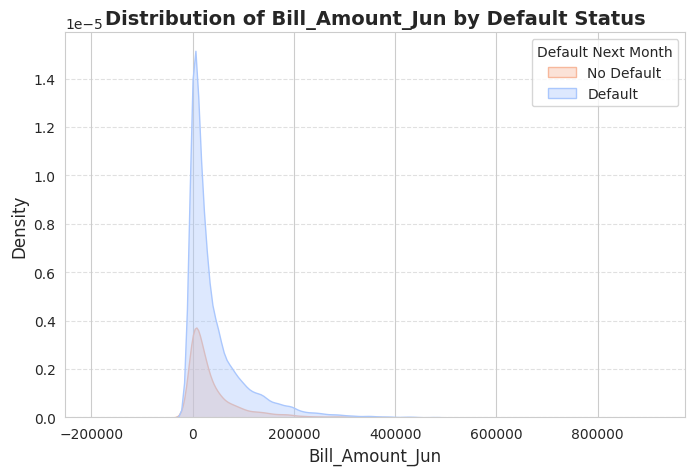

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


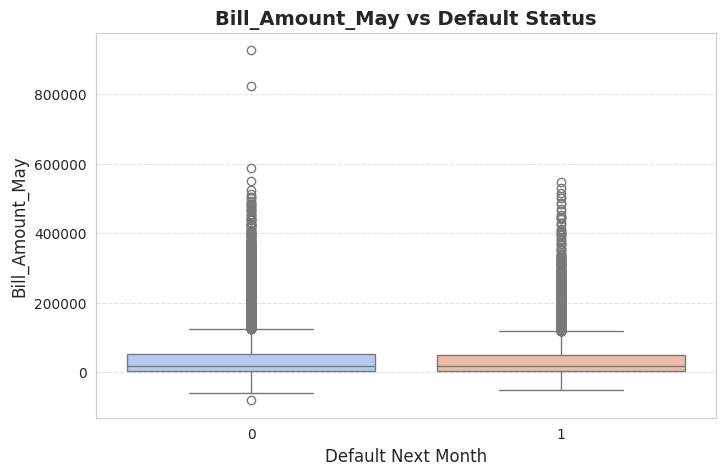

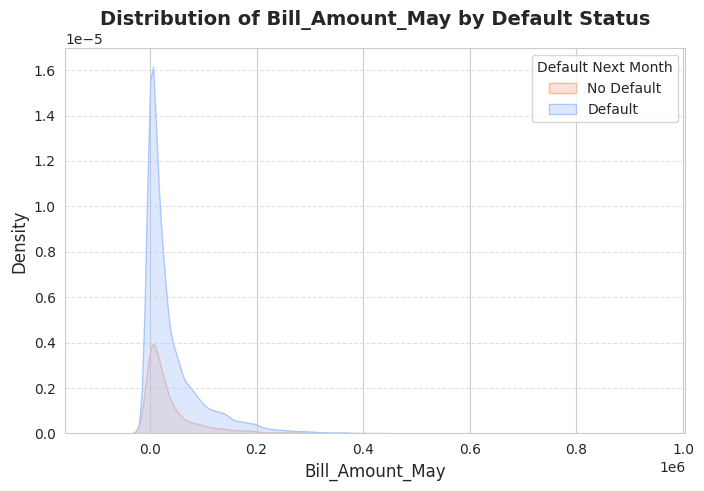

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


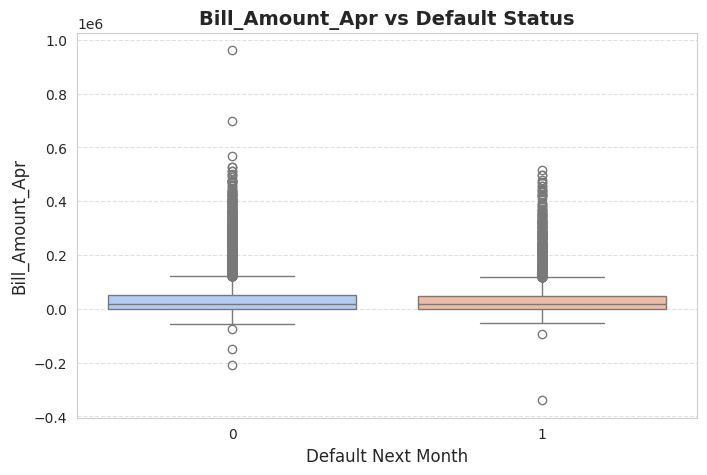

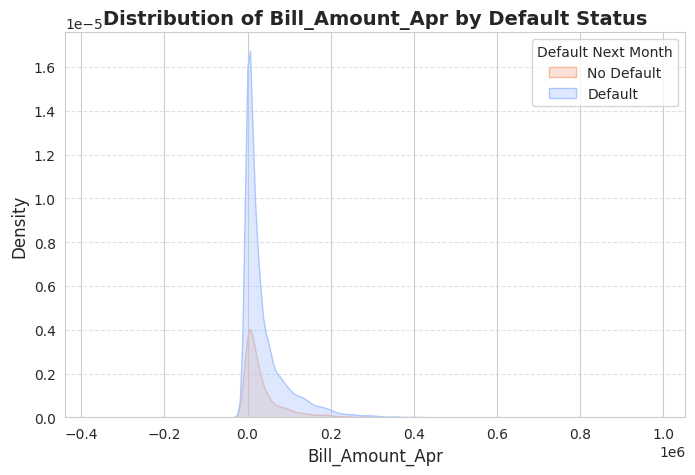

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


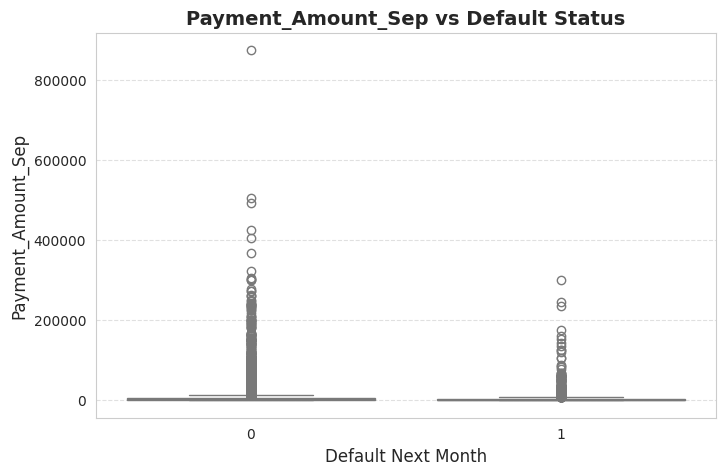

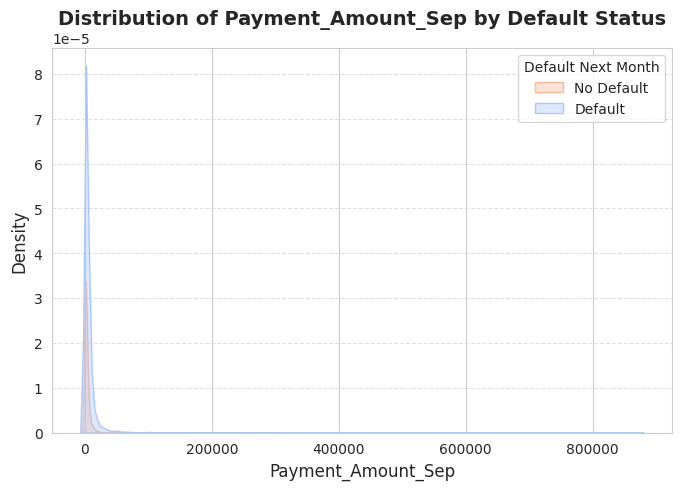

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


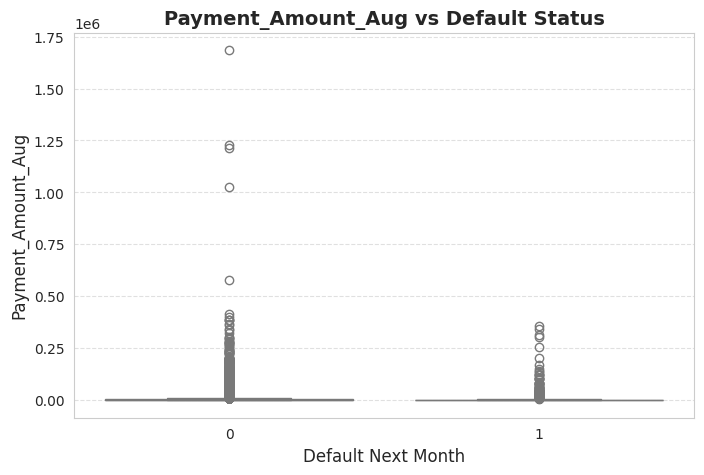

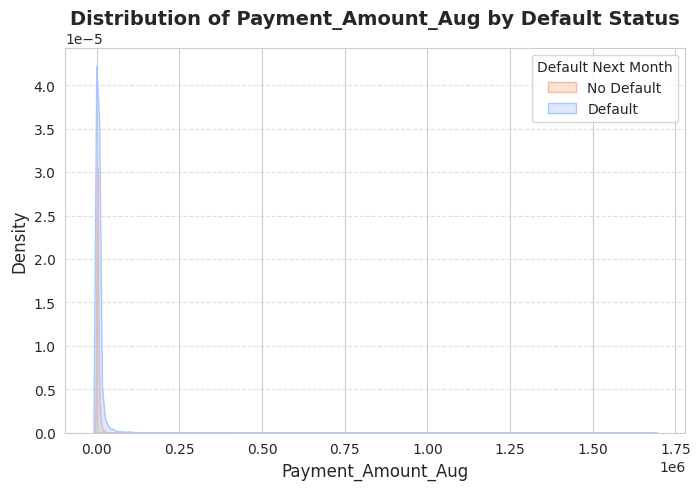

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


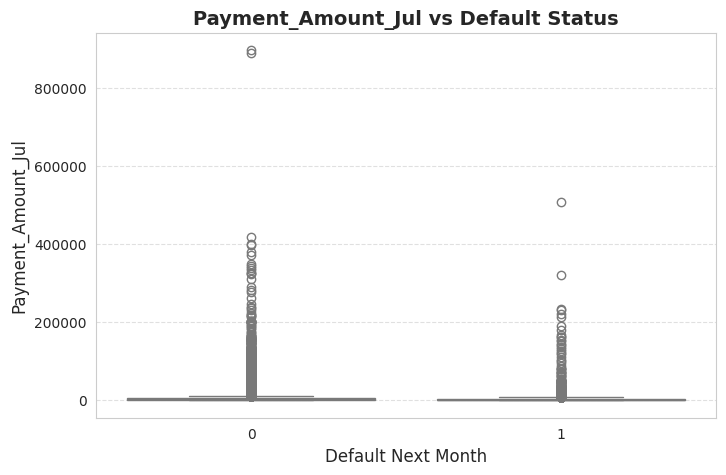

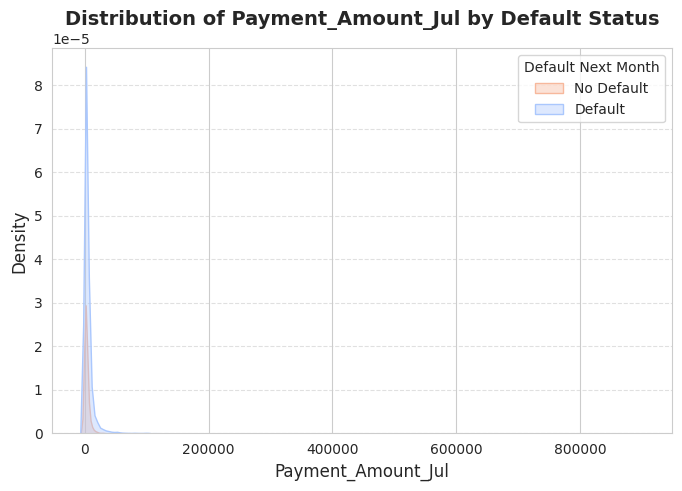

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


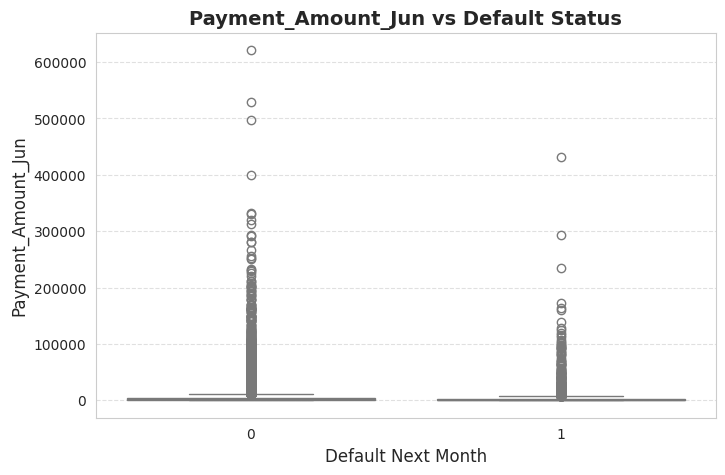

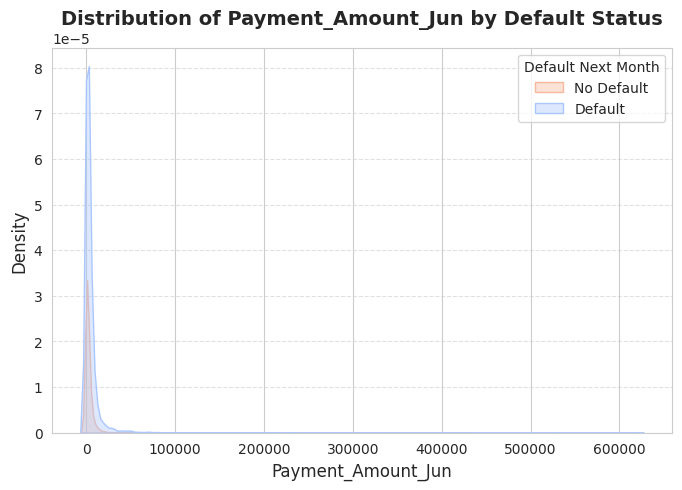

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


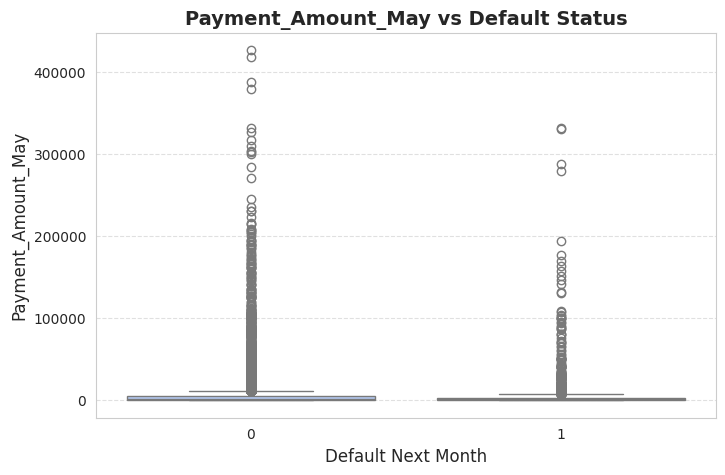

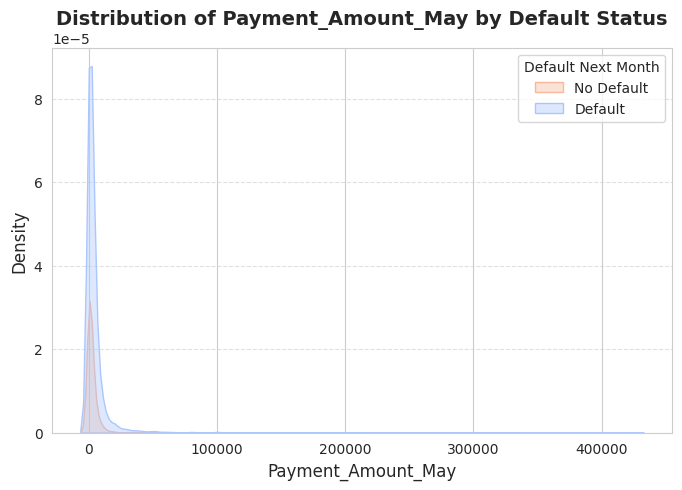

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


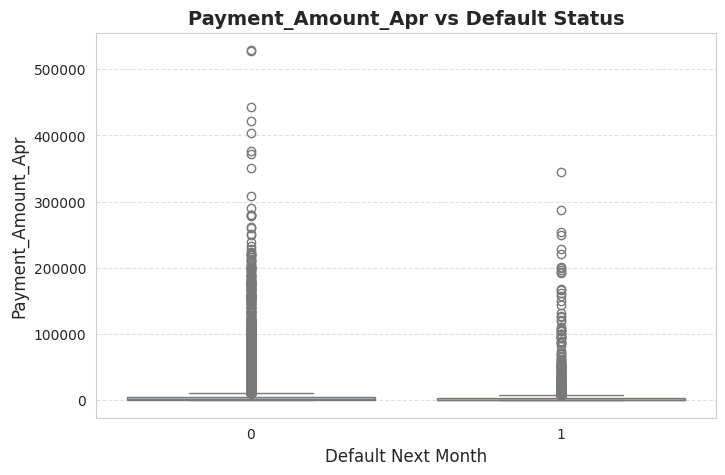

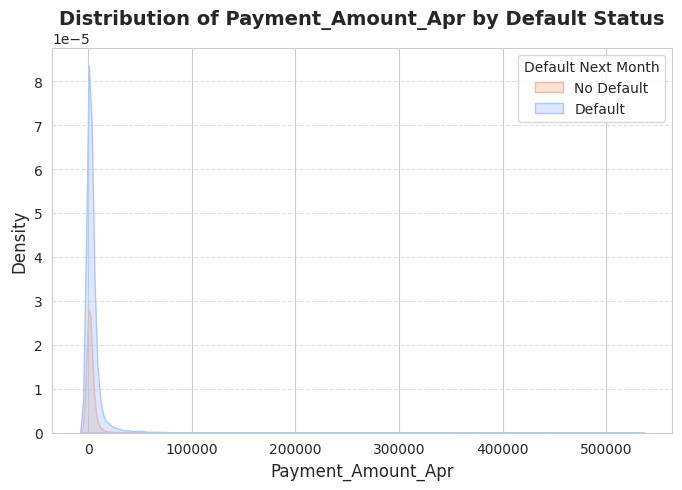

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


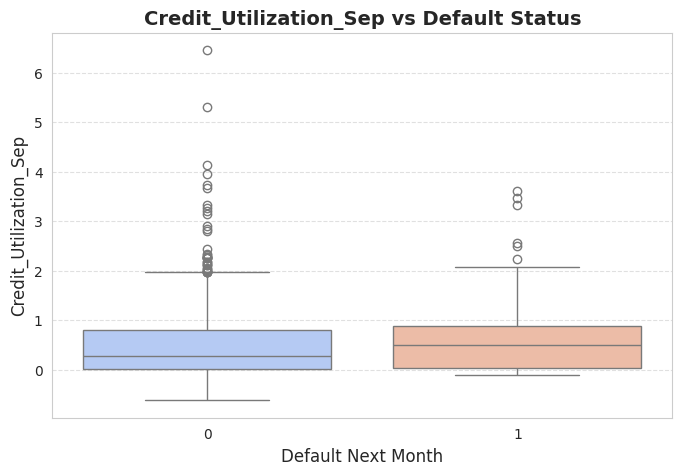

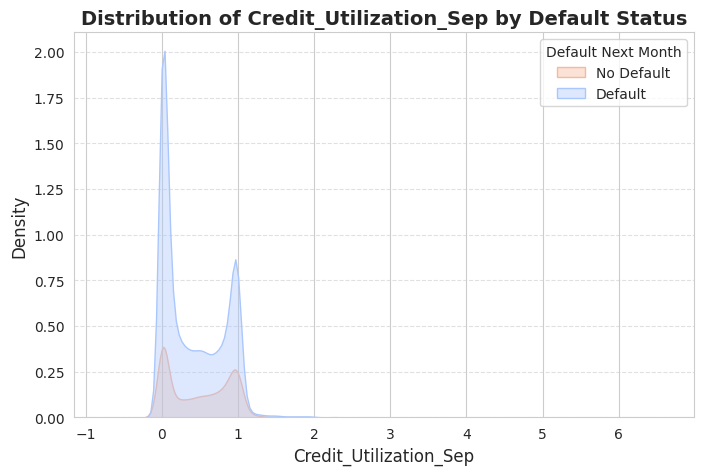

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


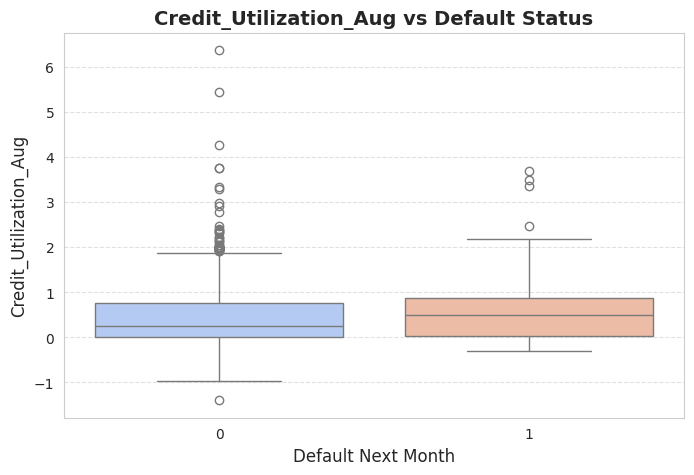

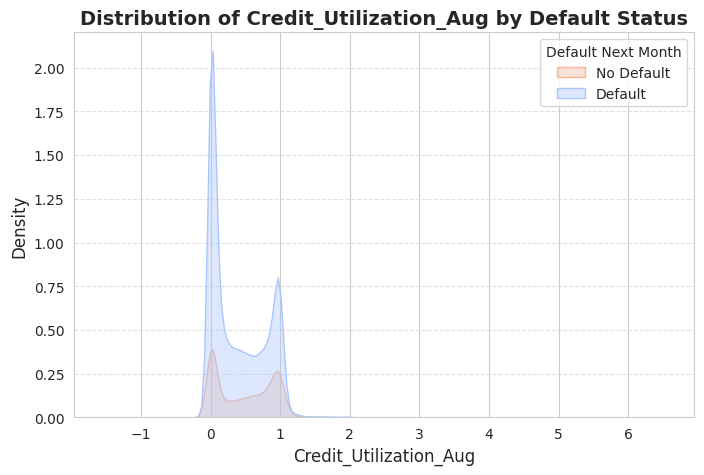

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


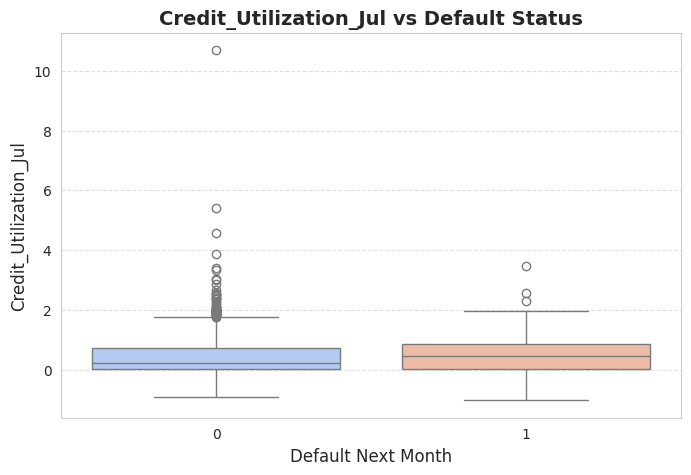

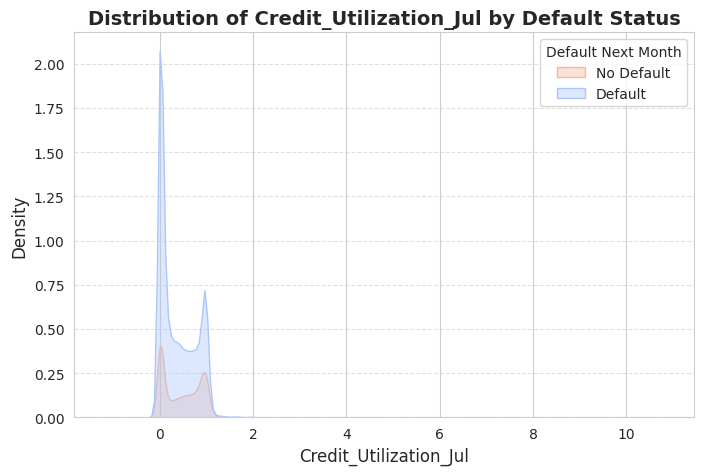

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


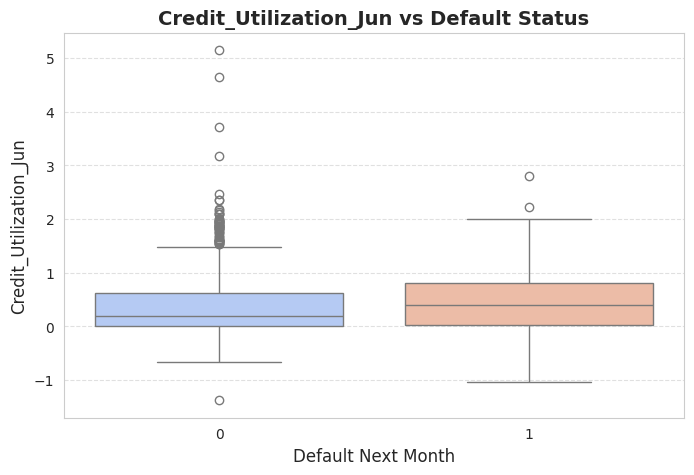

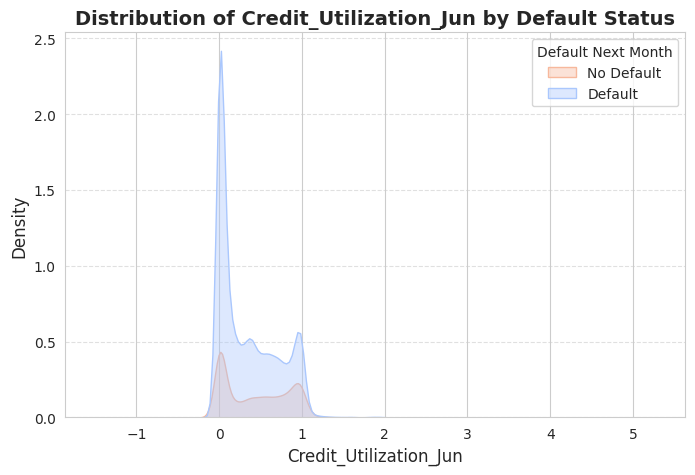

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


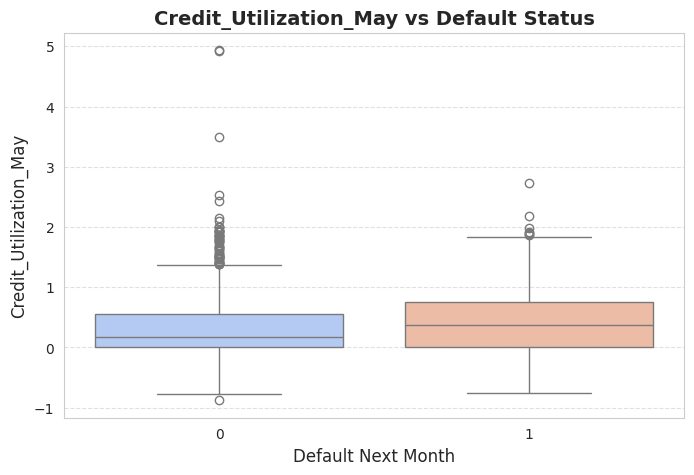

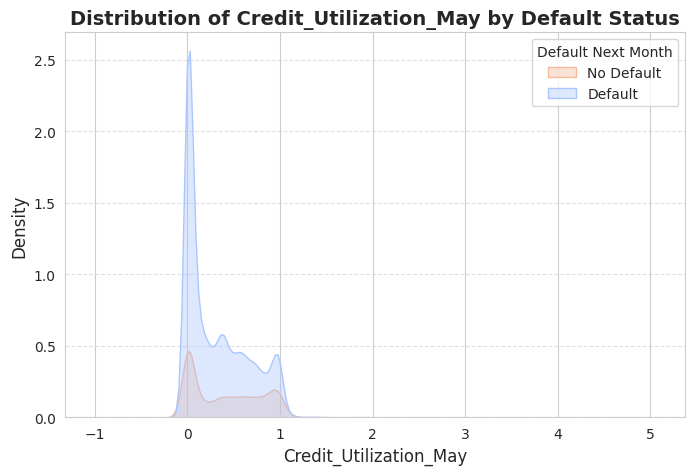

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


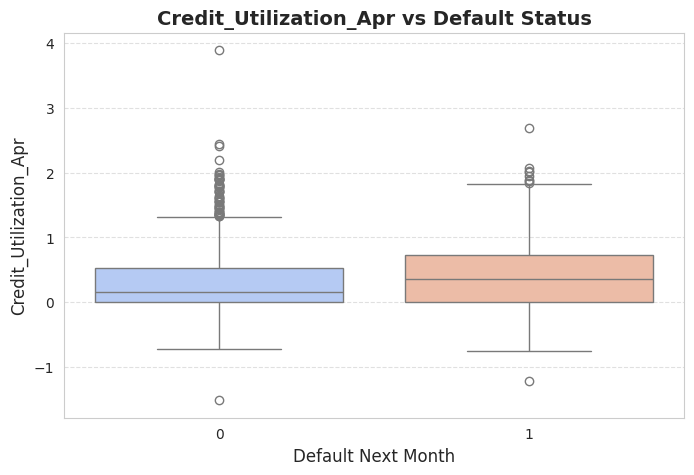

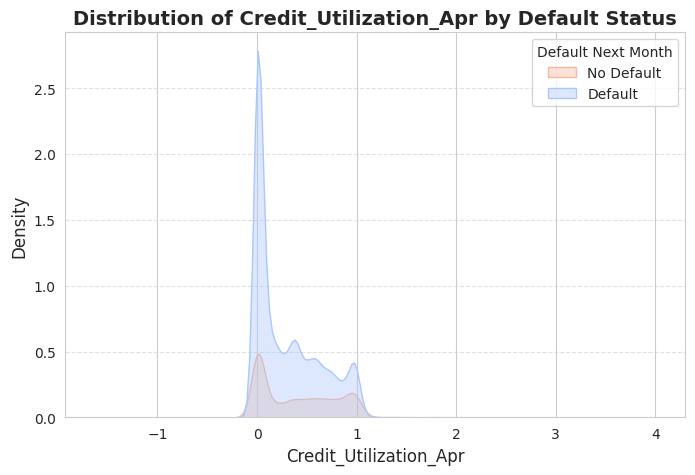

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


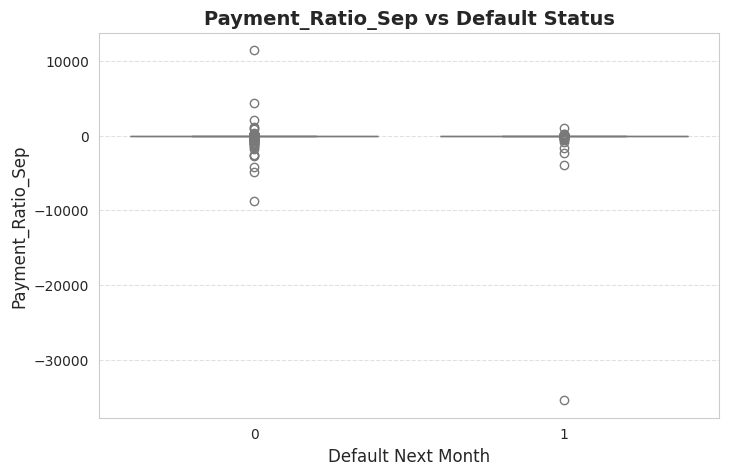

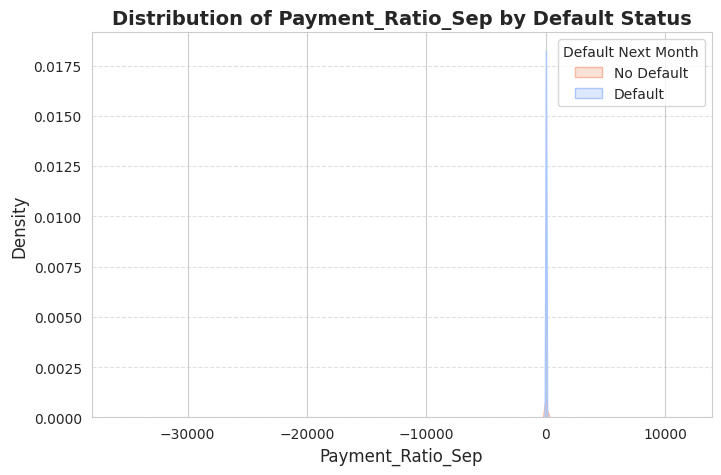

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


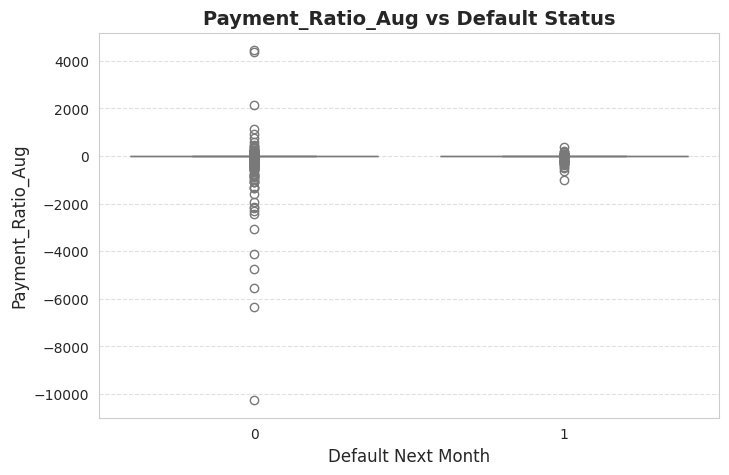

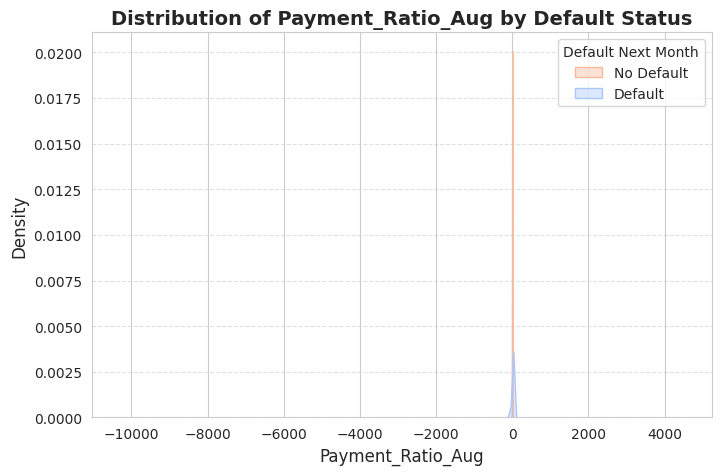

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


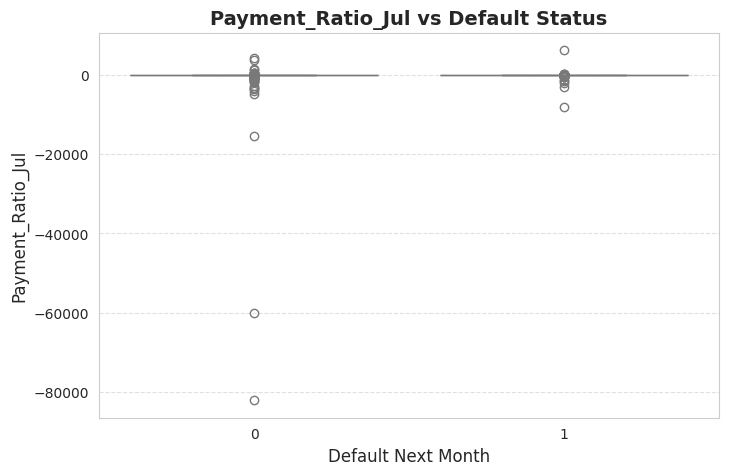

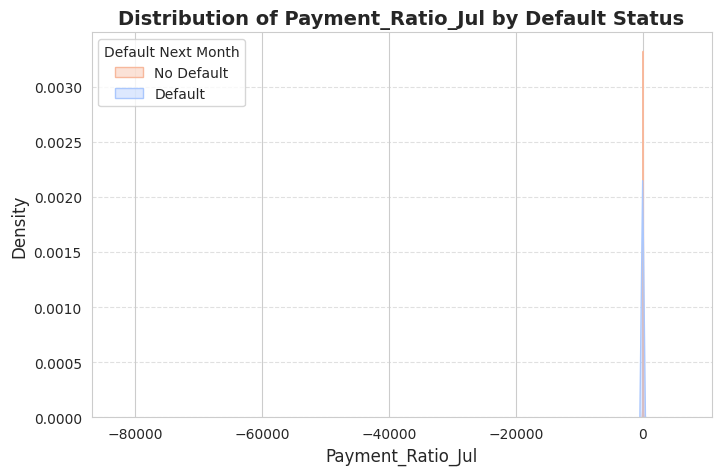

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


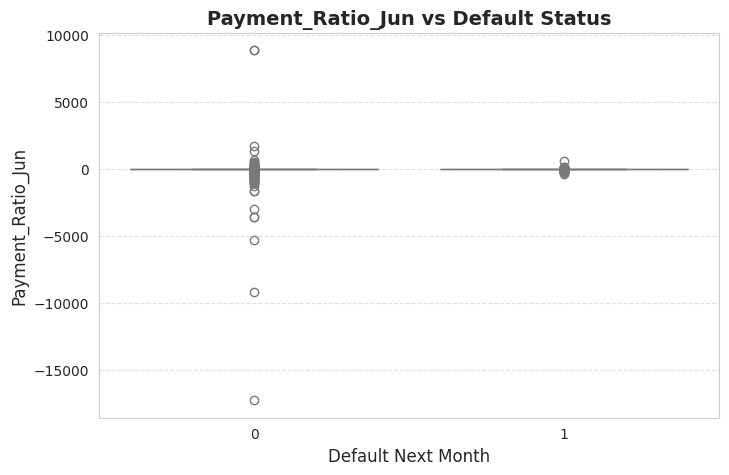

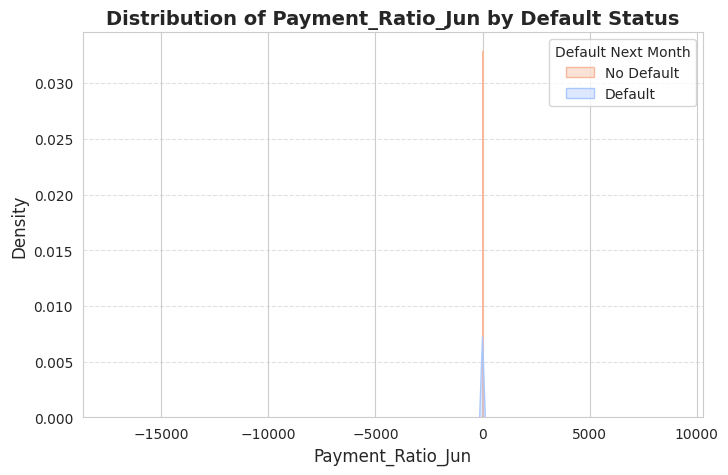

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


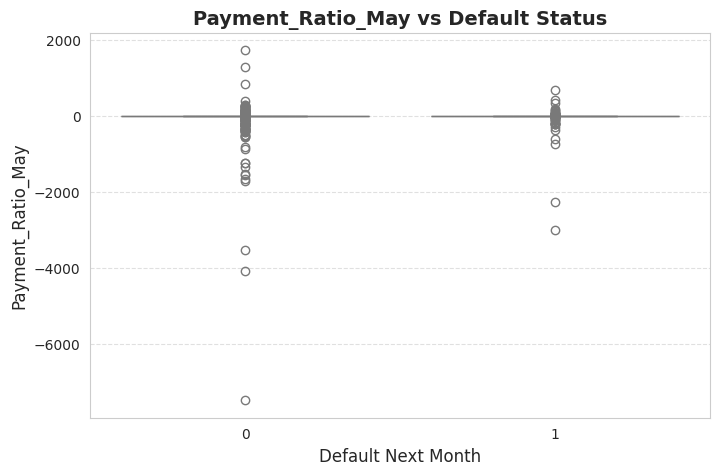

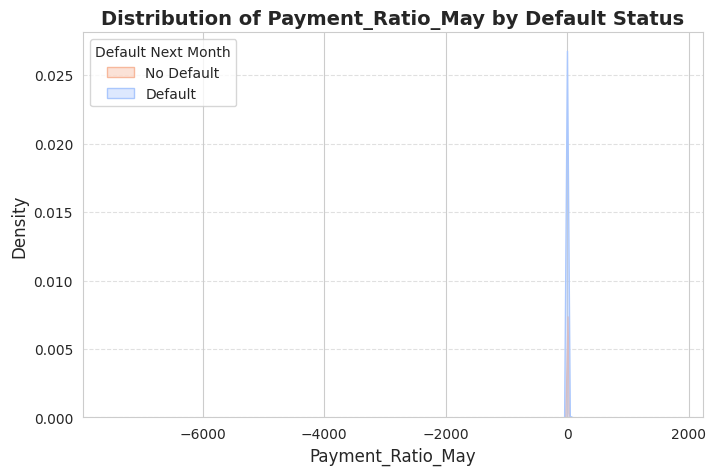

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


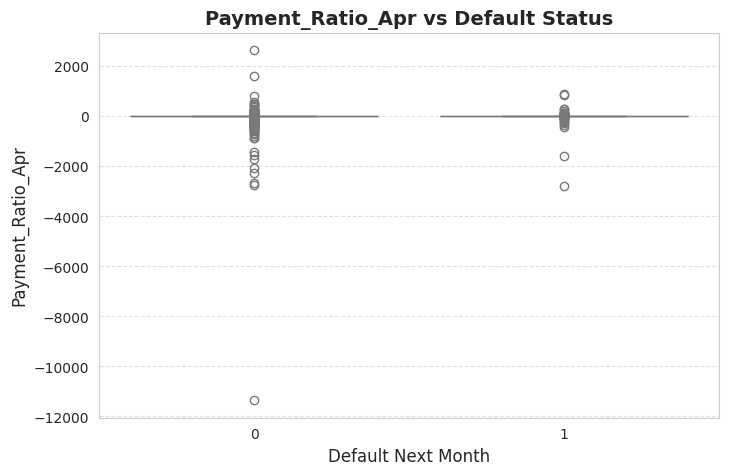

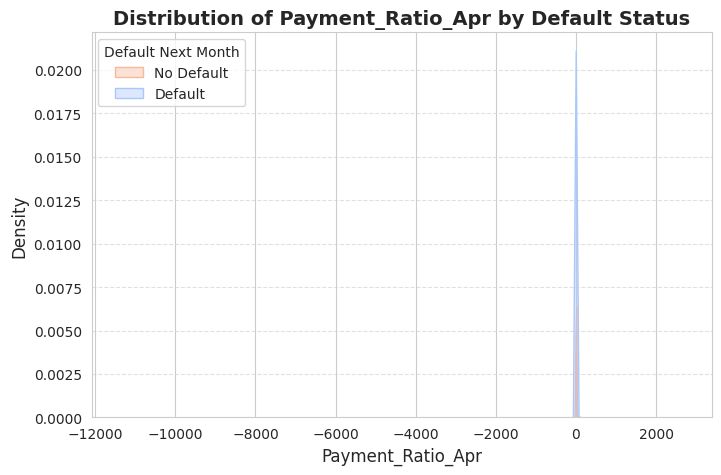

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


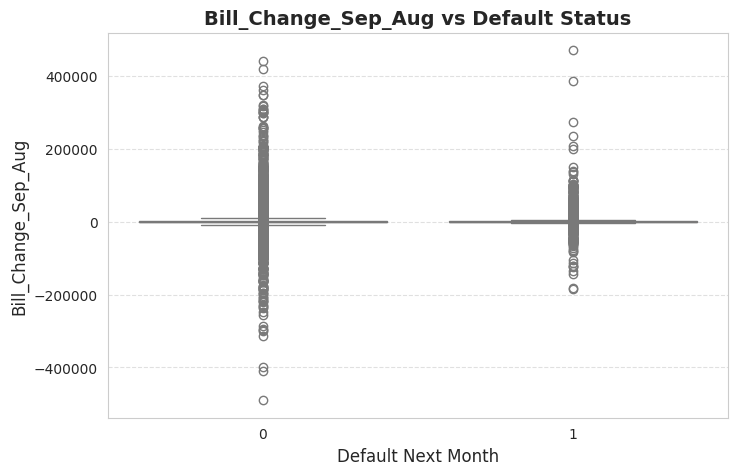

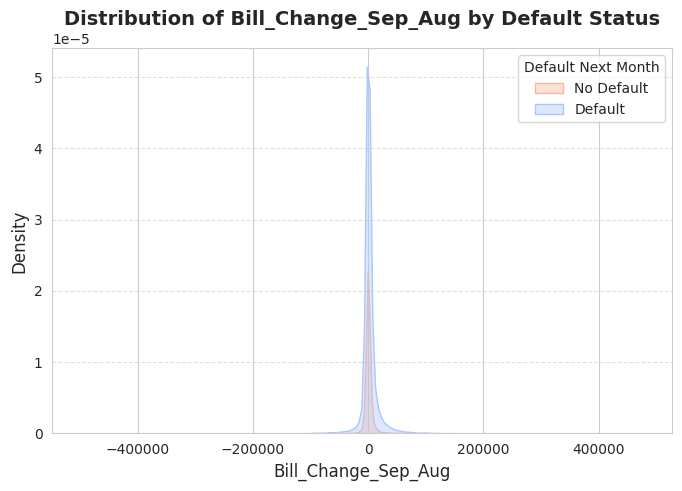

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


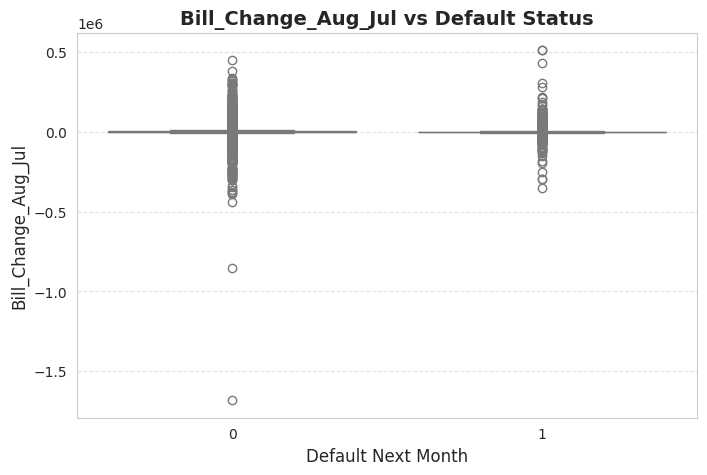

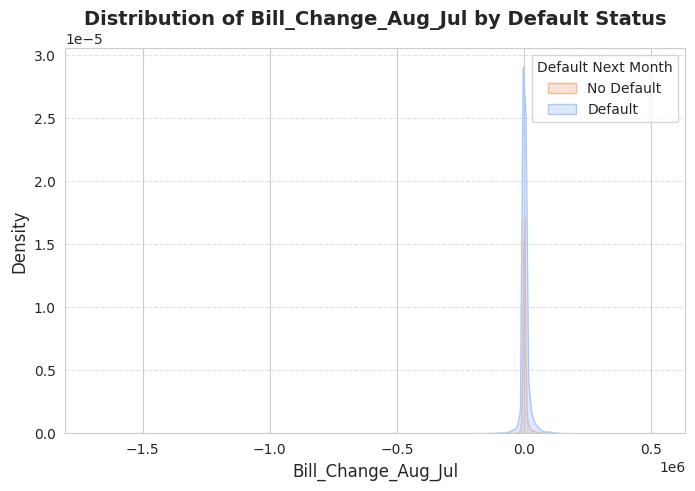

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


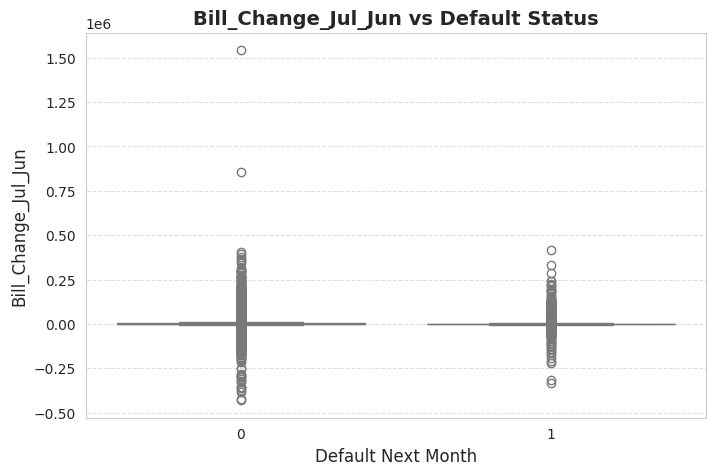

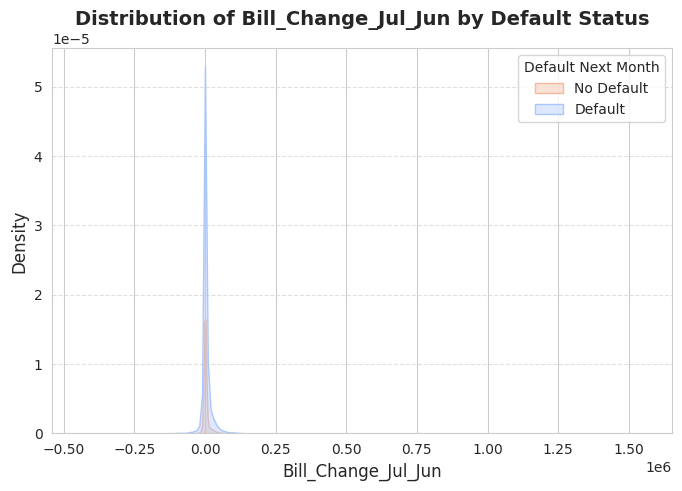

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


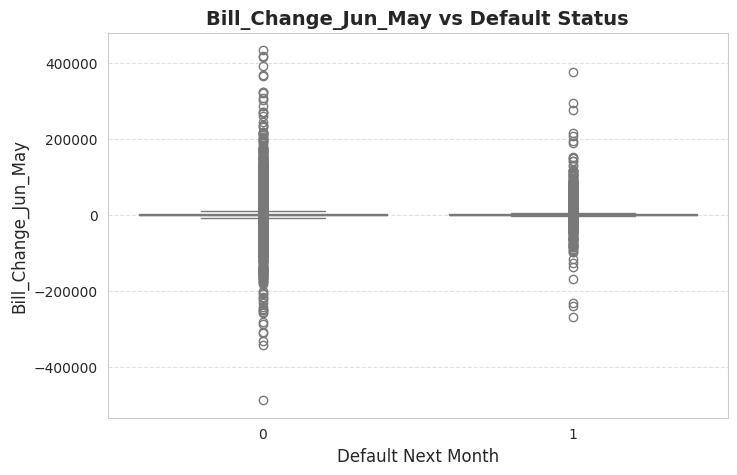

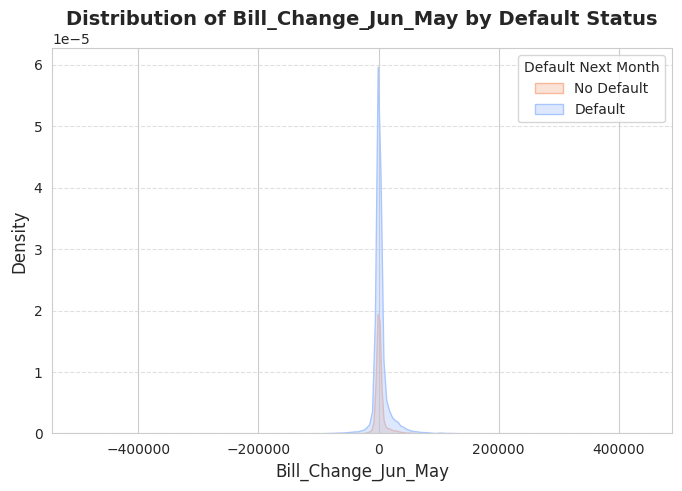

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


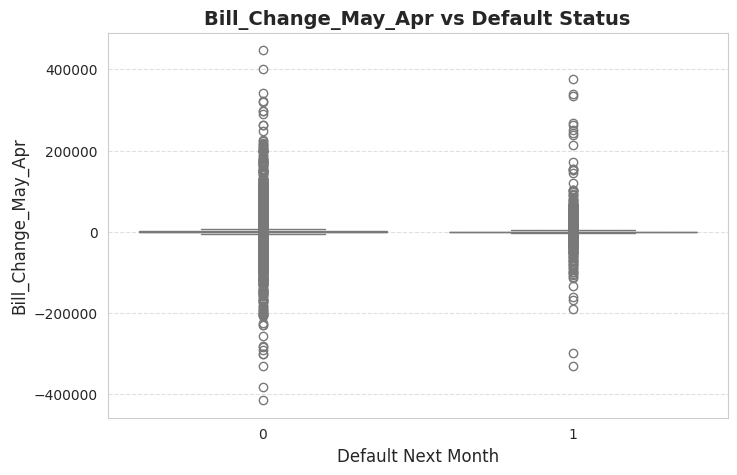

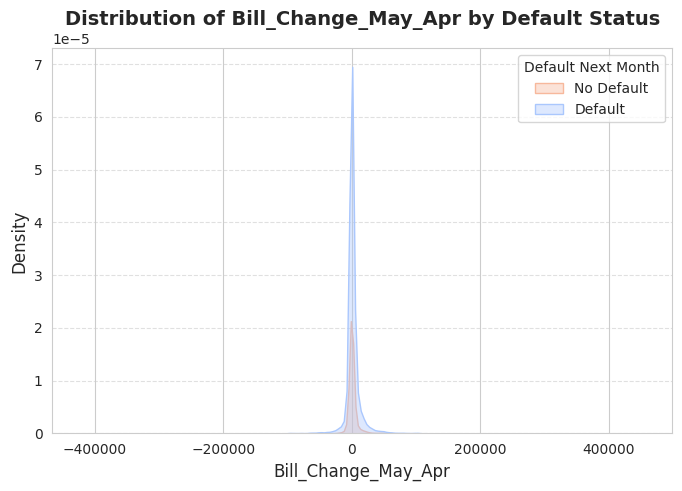

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


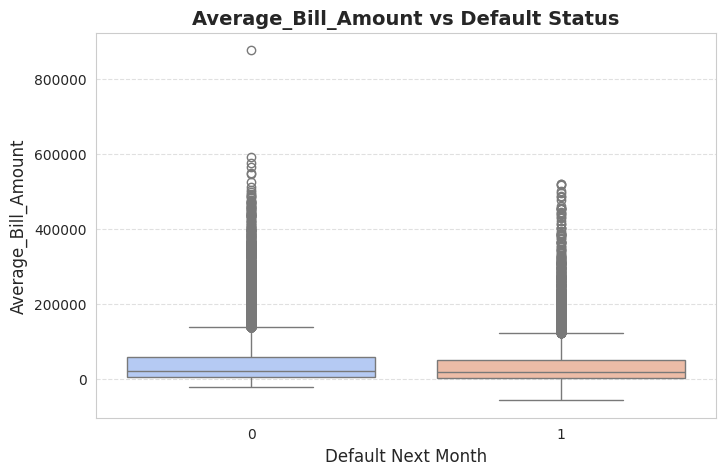

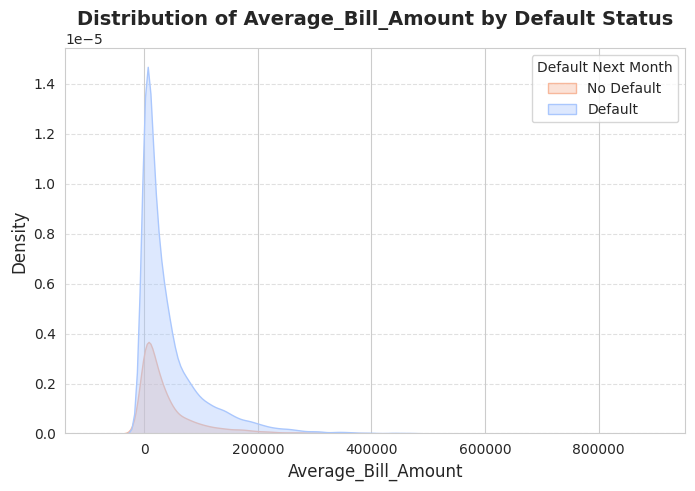

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


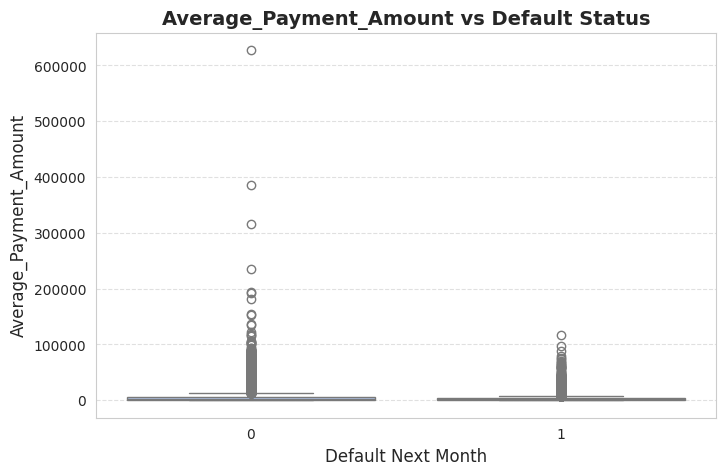

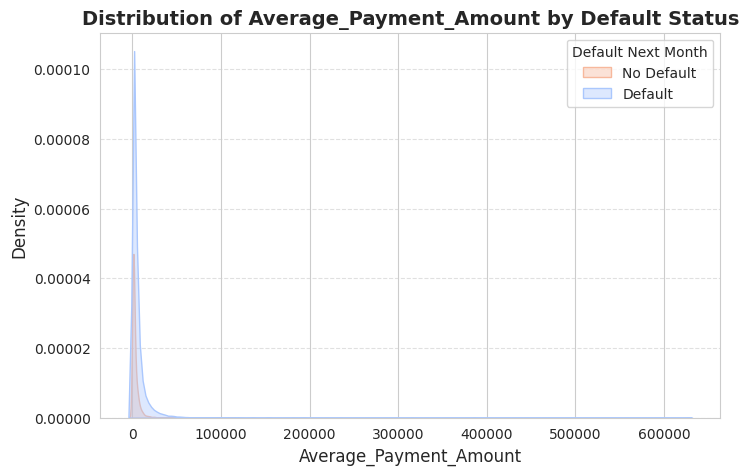

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


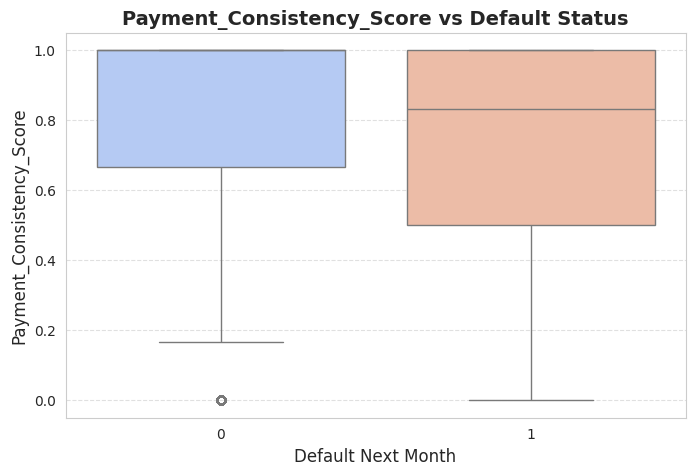

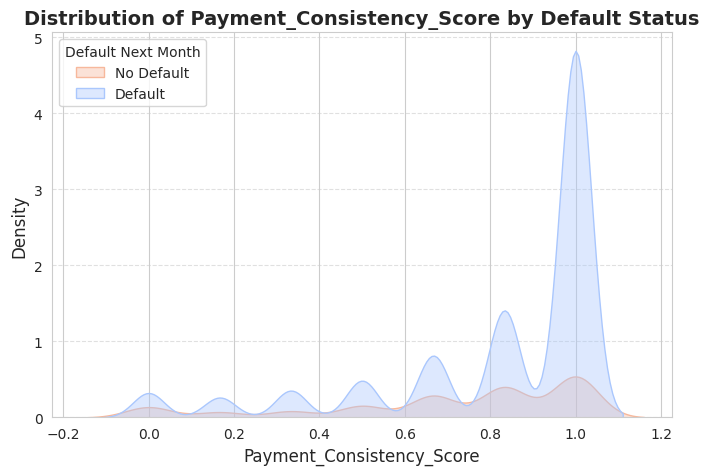

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


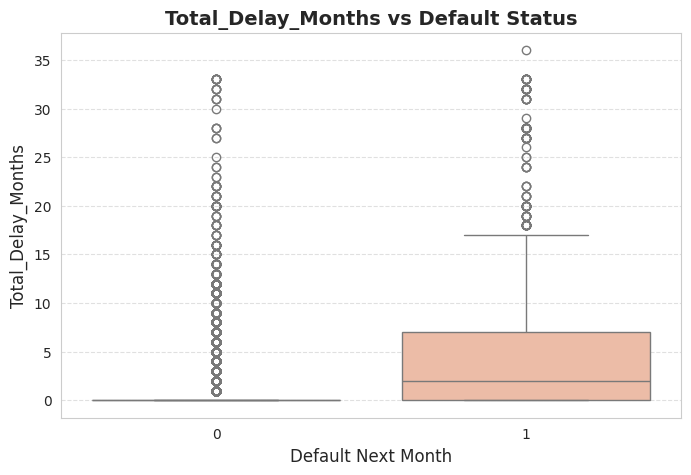

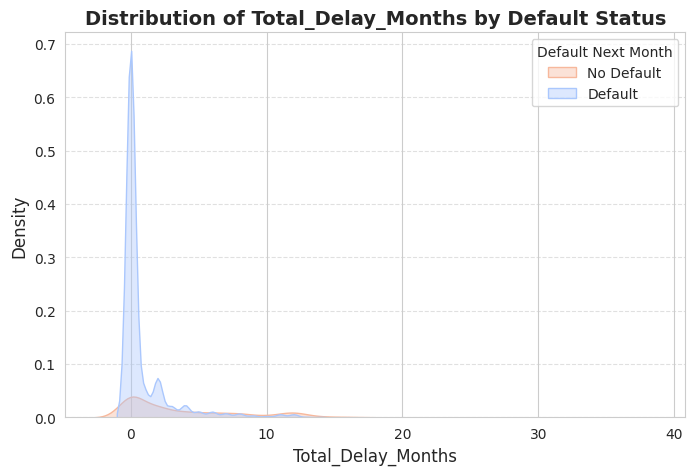

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


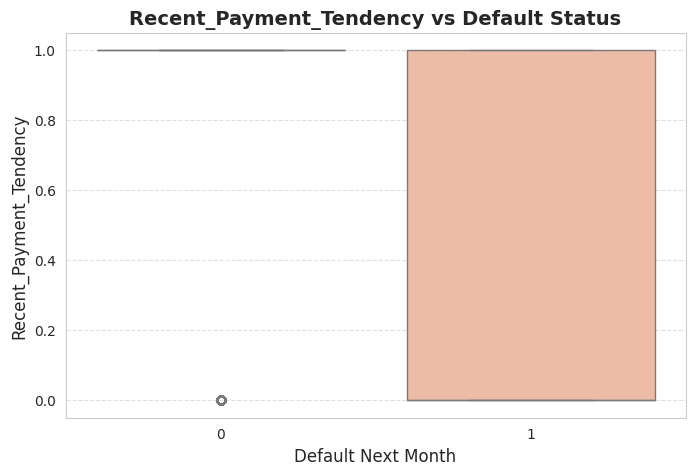

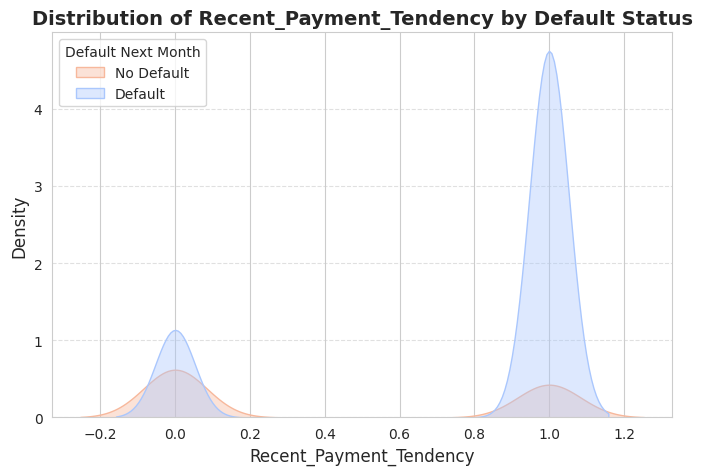

<ipython-input-67-945d1f299c76>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")


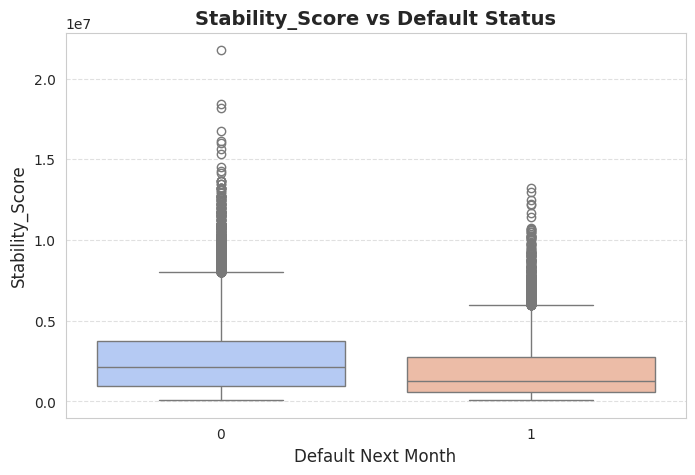

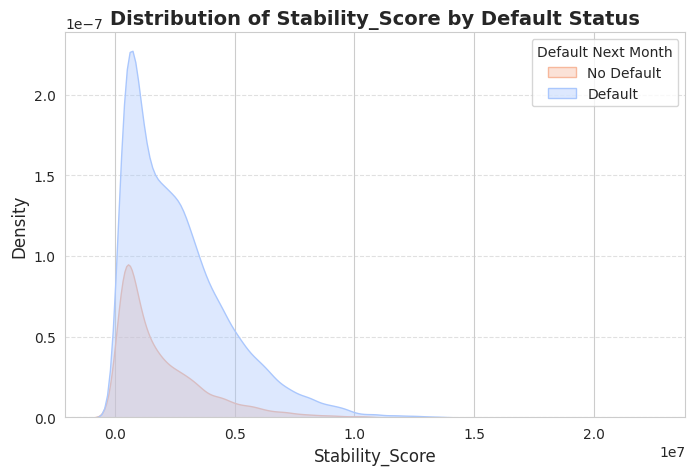

In [67]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Identify numerical and categorical columns (excluding Customer_ID)
categorical_columns = ["Gender", "Education_Level", "Marital_Status"]
numerical_columns = [col for col in df.columns if col not in categorical_columns + ["Customer_ID", "Default_Next_Month"]]

# Set a visually appealing style
sns.set_style("whitegrid")

# Bivariate Analysis - Categorical vs Target Variable (Default_Next_Month)
for col in categorical_columns:
    plt.figure(figsize=(8, 5))
    ax = sns.countplot(data=df, x=col, hue="Default_Next_Month", palette="coolwarm", alpha=0.8)

    # Add percentage labels
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(f'{height}', (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom', fontsize=12, color='black', fontweight='bold')

    plt.title(f"{col} vs Default Status", fontsize=14, fontweight="bold")
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Count", fontsize=12)
    plt.xticks(rotation=45)
    plt.legend(title="Default Next Month", labels=["No Default", "Default"])
    plt.grid(axis="y", linestyle="--", alpha=0.6)
    plt.show()

# Bivariate Analysis - Numerical vs Target Variable (Boxplots & KDE)
for col in numerical_columns:
    plt.figure(figsize=(8, 5))

    # Boxplot to compare distributions
    sns.boxplot(data=df, x="Default_Next_Month", y=col, palette="coolwarm")
    plt.title(f"{col} vs Default Status", fontsize=14, fontweight="bold")
    plt.xlabel("Default Next Month", fontsize=12)
    plt.ylabel(col, fontsize=12)
    plt.grid(axis="y", linestyle="--", alpha=0.6)
    plt.show()

    # KDE plot for density comparison
    plt.figure(figsize=(8, 5))
    sns.kdeplot(data=df, x=col, hue="Default_Next_Month", palette="coolwarm", fill=True, alpha=0.4)
    plt.title(f"Distribution of {col} by Default Status", fontsize=14, fontweight="bold")
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Density", fontsize=12)
    plt.grid(axis="y", linestyle="--", alpha=0.6)
    plt.legend(title="Default Next Month", labels=["No Default", "Default"])
    plt.show()


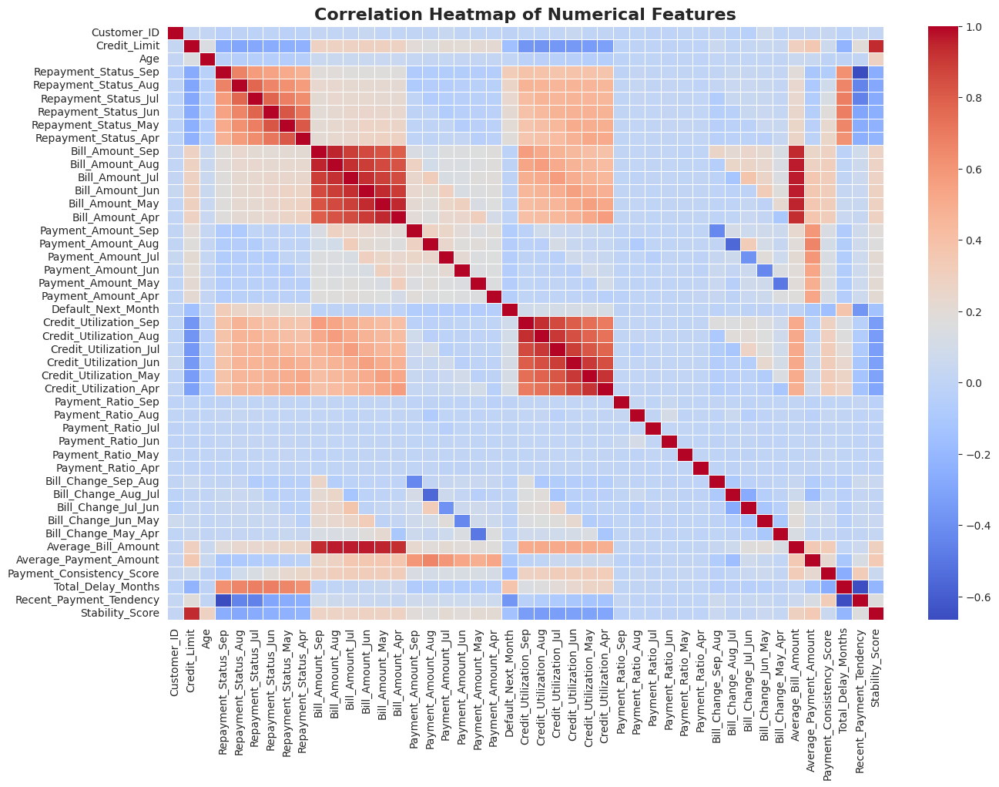

In [68]:
# Import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Select only numerical columns
numerical_columns = df.select_dtypes(include=["int64", "float64"]).columns

# Compute the correlation matrix for numerical features
correlation_matrix = df[numerical_columns].corr()

# Set up the figure size
plt.figure(figsize=(15, 10))

# Create a heatmap
sns.heatmap(correlation_matrix, annot=False, cmap="coolwarm", fmt=".2f", linewidths=0.5)

# Add title
plt.title("Correlation Heatmap of Numerical Features", fontsize=16, fontweight="bold")

# Show the plot
plt.show()

<Figure size 1200x1000 with 0 Axes>

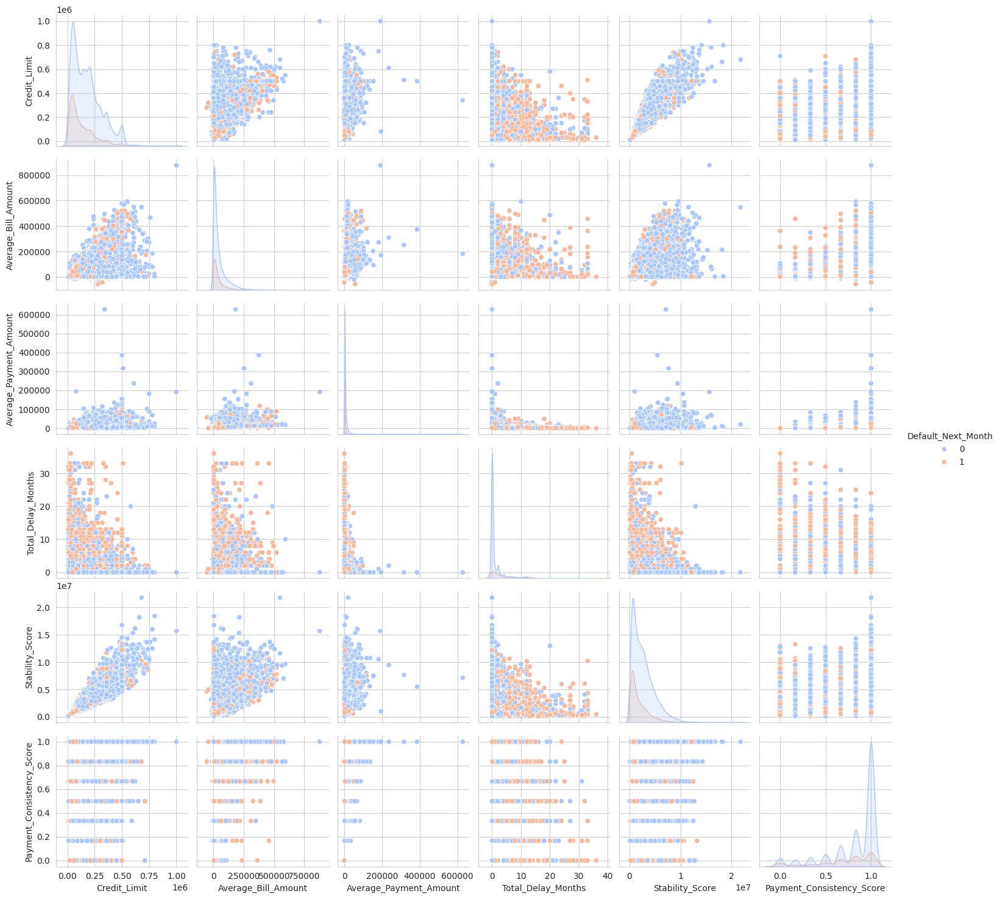

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define a new set of important numerical columns for visualization
selected_columns = [
    "Credit_Limit", "Average_Bill_Amount", "Average_Payment_Amount",
    "Total_Delay_Months", "Stability_Score", "Payment_Consistency_Score",
    "Default_Next_Month"
]

# Generate the pairplot
plt.figure(figsize=(12, 10))
sns.pairplot(df[selected_columns], hue="Default_Next_Month", palette="coolwarm", diag_kind="kde")
plt.show()


<ipython-input-70-4836f28dc987>:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stacked_counts = df.groupby(col)["Default_Next_Month"].value_counts(normalize=True).unstack()


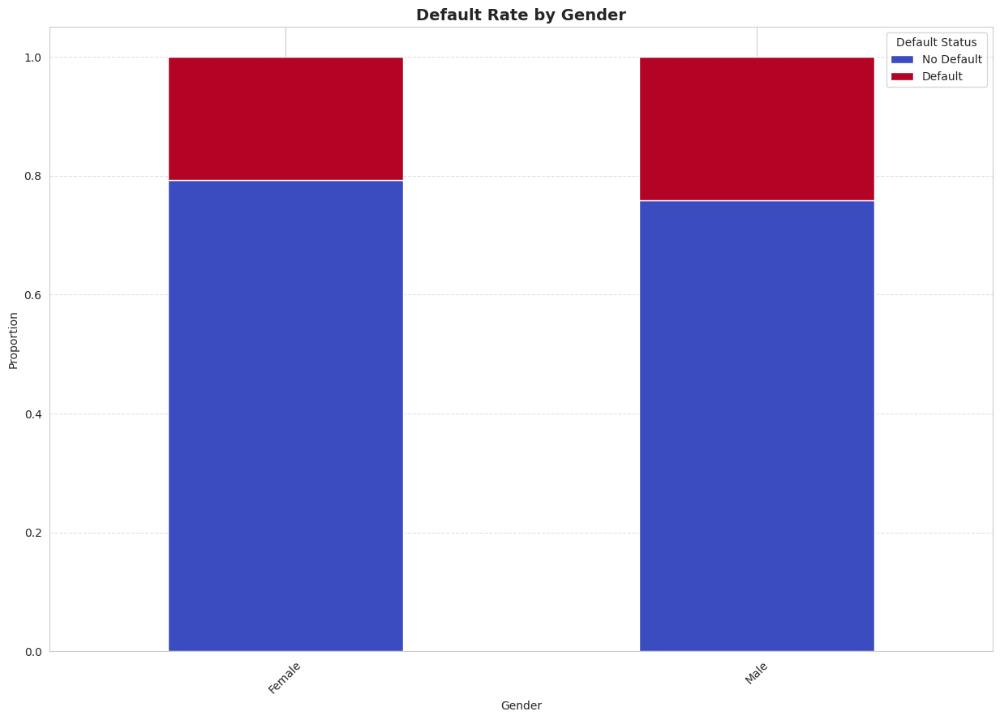

<ipython-input-70-4836f28dc987>:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stacked_counts = df.groupby(col)["Default_Next_Month"].value_counts(normalize=True).unstack()


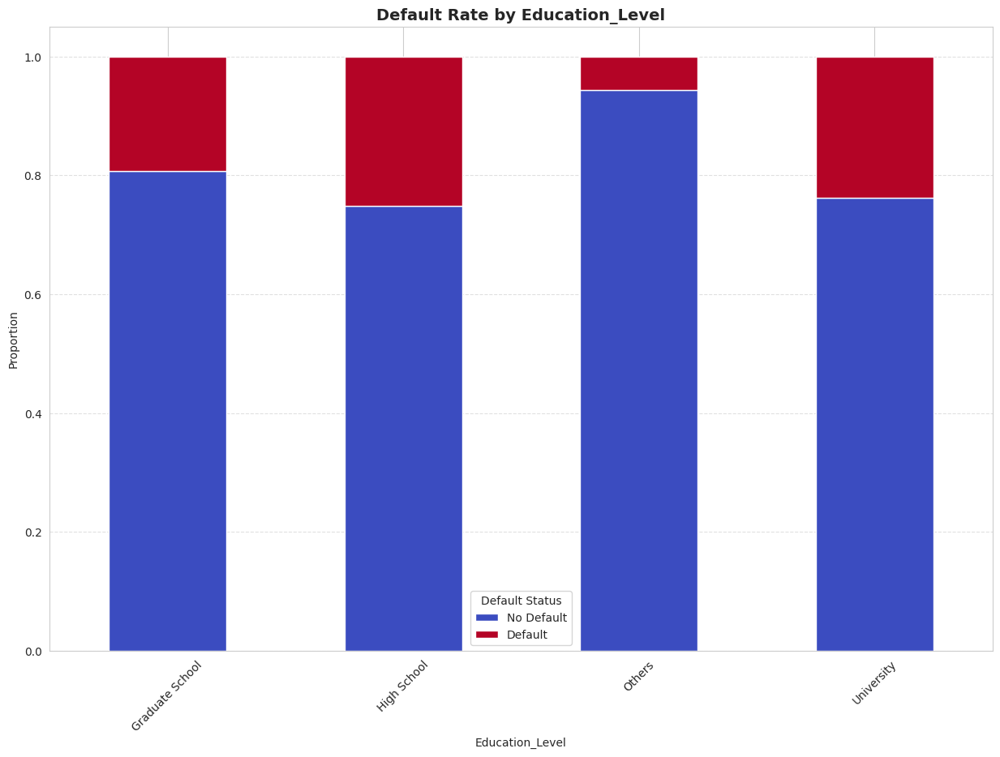

<ipython-input-70-4836f28dc987>:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stacked_counts = df.groupby(col)["Default_Next_Month"].value_counts(normalize=True).unstack()


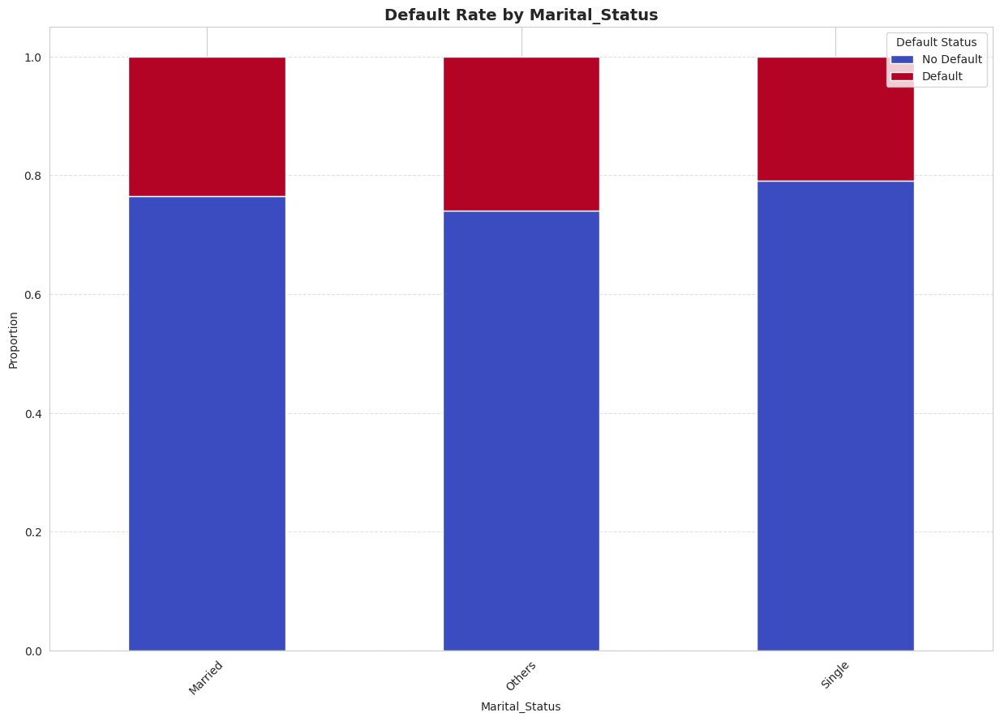

<ipython-input-70-4836f28dc987>:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stacked_counts = df.groupby(col)["Default_Next_Month"].value_counts(normalize=True).unstack()


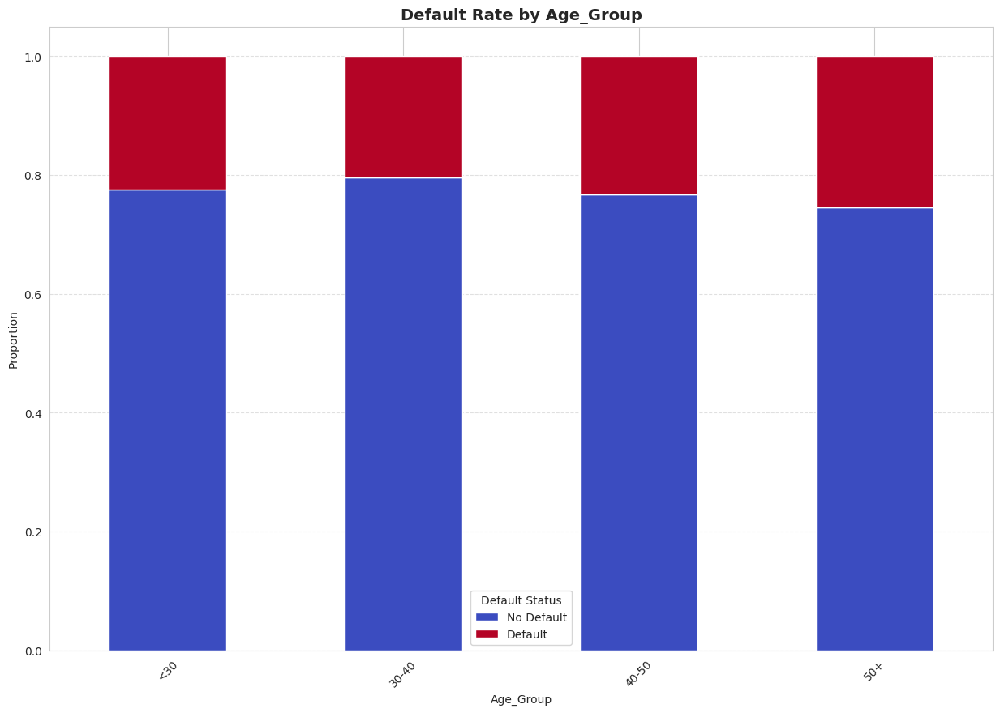

<ipython-input-70-4836f28dc987>:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stacked_counts = df.groupby(col)["Default_Next_Month"].value_counts(normalize=True).unstack()


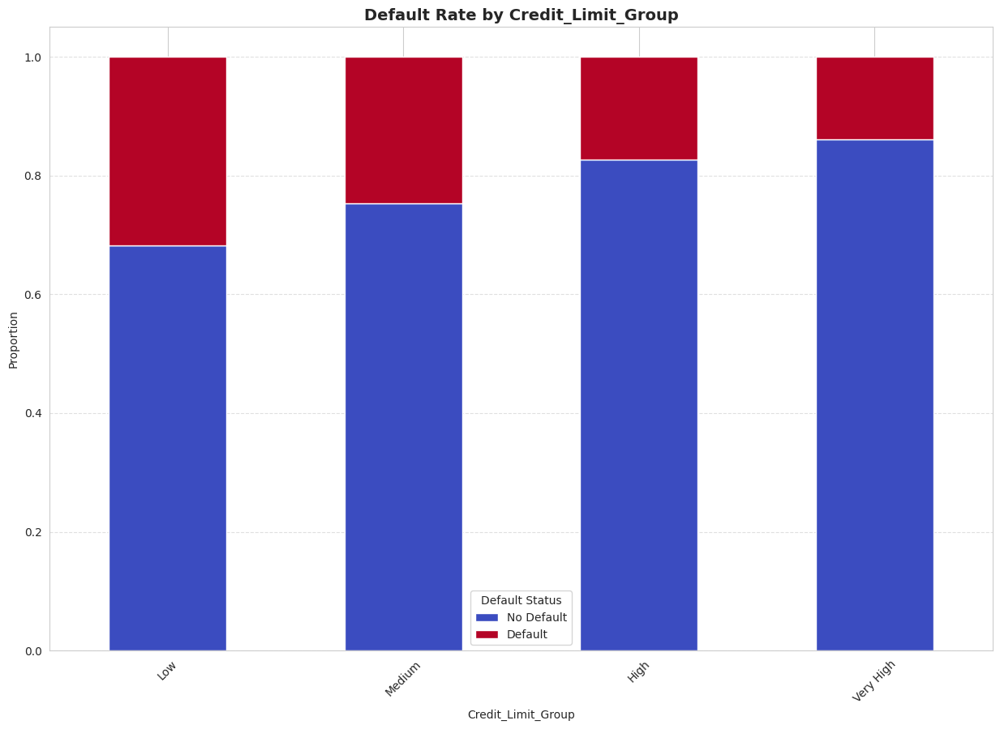

In [70]:
# Create Age Group column
df["Age_Group"] = pd.cut(df["Age"], bins=[20, 30, 40, 50, 100], labels=["<30", "30-40", "40-50", "50+"])

# Create Credit Limit Groups
df["Credit_Limit_Group"] = pd.qcut(df["Credit_Limit"], q=4, labels=["Low", "Medium", "High", "Very High"])

# Categorical columns to analyze
stacked_columns = ["Gender", "Education_Level", "Marital_Status", "Age_Group", "Credit_Limit_Group"]

# Plot Stacked Bar Charts
for col in stacked_columns:
    stacked_counts = df.groupby(col)["Default_Next_Month"].value_counts(normalize=True).unstack()

    # Plot stacked bar chart
    stacked_counts.plot(kind="bar", stacked=True, figsize=(15, 10), colormap="coolwarm")
    plt.title(f"Default Rate by {col}", fontsize=14, fontweight="bold")
    plt.xlabel(col)
    plt.ylabel("Proportion")
    plt.legend(title="Default Status", labels=["No Default", "Default"])
    plt.xticks(rotation=45)
    plt.grid(axis="y", linestyle="--", alpha=0.6)
    plt.show()


In [71]:
import numpy as np

# Identify columns containing infinity or extremely large values
invalid_values = df[numerical_columns].replace([np.inf, -np.inf], np.nan).isnull().sum()

# Display columns with invalid values
print("Columns with Inf or NaN values:\n", invalid_values[invalid_values > 0])

Columns with Inf or NaN values:
 Payment_Ratio_Sep    2008
Payment_Ratio_Aug    2506
Payment_Ratio_Jul    2870
Payment_Ratio_Jun    3195
Payment_Ratio_May    3506
Payment_Ratio_Apr    4020
Stability_Score        54
dtype: int64


In [72]:
import numpy as np

# Identify columns containing Inf values
inf_values = df_cleaned[numerical_columns].replace([np.inf, -np.inf], np.nan).isnull().sum()

# Display columns with Inf values
print("Columns with Inf values:\n", inf_values[inf_values > 0])

Columns with Inf values:
 Series([], dtype: int64)


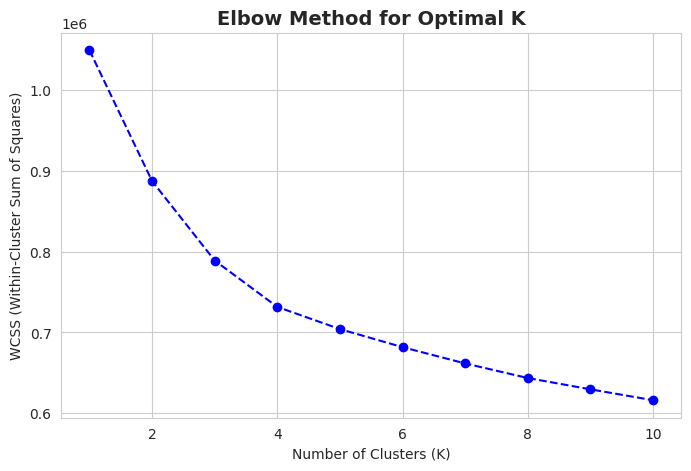

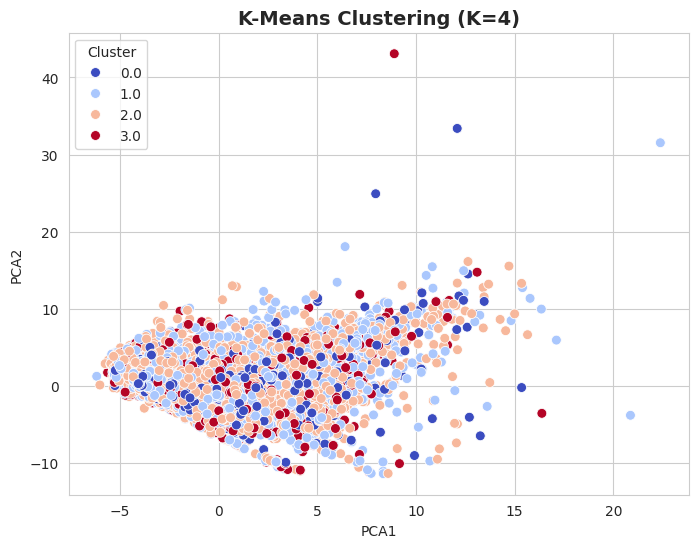

In [73]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Select only numerical columns (exclude categorical and ID columns)
numerical_columns = df.select_dtypes(include=["int64", "float64"]).columns.tolist()

# Replace infinite values with NaN and drop rows containing NaN in specified columns
df_cleaned = df.replace([np.inf, -np.inf], np.nan).dropna(subset=[
    "Payment_Ratio_Sep", "Payment_Ratio_Aug", "Payment_Ratio_Jul",
    "Payment_Ratio_Jun", "Payment_Ratio_May", "Payment_Ratio_Apr",
    "Stability_Score"])

# Select only numerical columns (excluding categorical and ID columns)
numerical_columns = df_cleaned.select_dtypes(include=["int64", "float64"]).columns.tolist()
numerical_columns.remove("Customer_ID")  # Remove ID column

# Standardizing numerical data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_cleaned[numerical_columns])

# Finding the optimal K using the Elbow Method
wcss = []  # Within-cluster sum of squares
K_range = range(1, 11)  # Trying K values from 1 to 10

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(scaled_data)
    wcss.append(kmeans.inertia_)

# Plot the Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(K_range, wcss, marker="o", linestyle="--", color="blue")
plt.title("Elbow Method for Optimal K", fontsize=14, fontweight="bold")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("WCSS (Within-Cluster Sum of Squares)")
plt.grid(True)
plt.show()

# Select optimal K (choose based on elbow method, assume best K is 4 for now)
optimal_k = 4  # Adjust this based on the elbow method plot
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_cleaned["KMeans_Cluster"] = kmeans.fit_predict(scaled_data)

# Reduce dimensions for visualization (PCA)
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)

# Convert PCA result to DataFrame
df_pca = pd.DataFrame(pca_data, columns=["PCA1", "PCA2"])
df_pca["KMeans_Cluster"] = df_cleaned["KMeans_Cluster"]

# Visualization of K-Means Clusters in 2D PCA Space
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df_pca["PCA1"], y=df_pca["PCA2"], hue=df_pca["KMeans_Cluster"], palette="coolwarm", s=50)
plt.title(f"K-Means Clustering (K={optimal_k})", fontsize=14, fontweight="bold")
plt.xlabel("PCA1")
plt.ylabel("PCA2")
plt.legend(title="Cluster")
plt.grid(True)
plt.show()


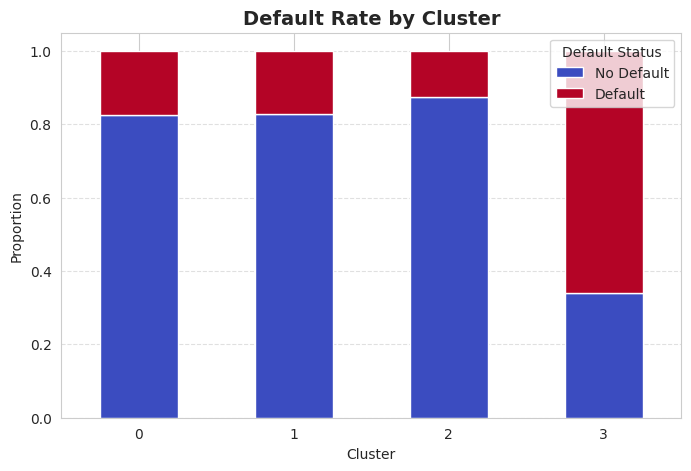

In [74]:
# Compute proportions of default within each cluster
cluster_default_counts = df_cleaned.groupby("KMeans_Cluster")["Default_Next_Month"].value_counts(normalize=True).unstack()

# Plot Stacked Bar Chart
cluster_default_counts.plot(kind="bar", stacked=True, figsize=(8, 5), colormap="coolwarm")
plt.title("Default Rate by Cluster", fontsize=14, fontweight="bold")
plt.xlabel("Cluster")
plt.ylabel("Proportion")
plt.legend(title="Default Status", labels=["No Default", "Default"])
plt.xticks(rotation=0)
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.show()

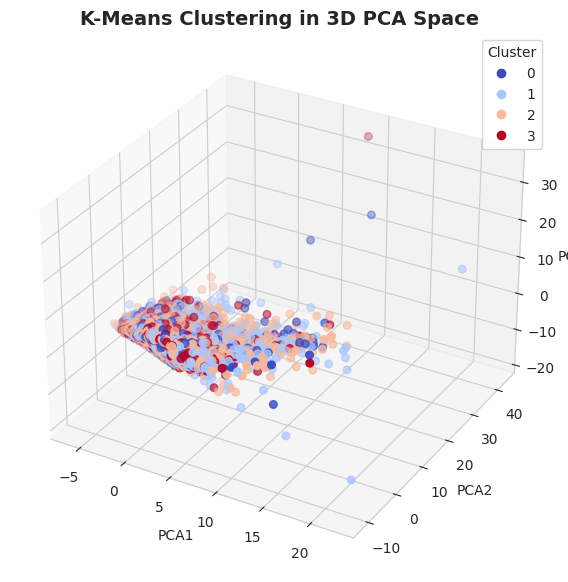

In [75]:
from mpl_toolkits.mplot3d import Axes3D

# Perform PCA with 3 components for 3D visualization
pca_3d = PCA(n_components=3)
pca_3d_data = pca_3d.fit_transform(scaled_data)

df_pca_3d = pd.DataFrame(pca_3d_data, columns=["PCA1", "PCA2", "PCA3"])
df_pca_3d["KMeans_Cluster"] = df_cleaned["KMeans_Cluster"]

# Create 3D Scatter Plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_pca_3d["PCA1"], df_pca_3d["PCA2"], df_pca_3d["PCA3"],
                     c=df_pca_3d["KMeans_Cluster"], cmap="coolwarm", s=30)

ax.set_title("K-Means Clustering in 3D PCA Space", fontsize=14, fontweight="bold")
ax.set_xlabel("PCA1")
ax.set_ylabel("PCA2")
ax.set_zlabel("PCA3")
plt.legend(*scatter.legend_elements(), title="Cluster")
plt.show()


In [76]:
pip install catboost

In [86]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import lightgbm as lgb
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE

In [87]:
# Encode categorical variables
categorical_columns = df.select_dtypes(include=["object", "category"]).columns.tolist()
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le


In [88]:
# Replace infinite values with NaN and drop rows containing NaN in specified columns
df_cleaned = df.replace([np.inf, -np.inf], np.nan).dropna(subset=[
    "Payment_Ratio_Sep", "Payment_Ratio_Aug", "Payment_Ratio_Jul",
    "Payment_Ratio_Jun", "Payment_Ratio_May", "Payment_Ratio_Apr",
    "Stability_Score"])


In [89]:
# Select all numerical and categorical columns (excluding ID columns)
numerical_columns = df_cleaned.select_dtypes(include=["int64", "float64"]).columns.tolist()
categorical_columns = df_cleaned.select_dtypes(include=["int32", "category"]).columns.tolist()
numerical_columns.remove("Customer_ID")  # Remove ID column


In [90]:
# Combine numerical and categorical columns
all_features = numerical_columns + categorical_columns

In [91]:
# Split dataset into training and testing sets
X = df_cleaned[all_features]
y = df_cleaned["Default_Next_Month"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [92]:
# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

In [93]:
# List of models to evaluate
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Random Forest": RandomForestClassifier(n_estimators=200, max_depth=10, random_state=42, n_jobs=-1),
    "XGBoost": XGBClassifier(n_estimators=200, max_depth=6, learning_rate=0.1, random_state=42, n_jobs=-1),
    "LightGBM": lgb.LGBMClassifier(n_estimators=200, max_depth=7, learning_rate=0.05, random_state=42, n_jobs=-1),
    "CatBoost": CatBoostClassifier(n_estimators=200, depth=6, learning_rate=0.05, random_state=42, verbose=0)
}



Logistic Regression Model:


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.72      0.77      5542
           1       0.34      0.50      0.41      1614

    accuracy                           0.67      7156
   macro avg       0.59      0.61      0.59      7156
weighted avg       0.72      0.67      0.69      7156



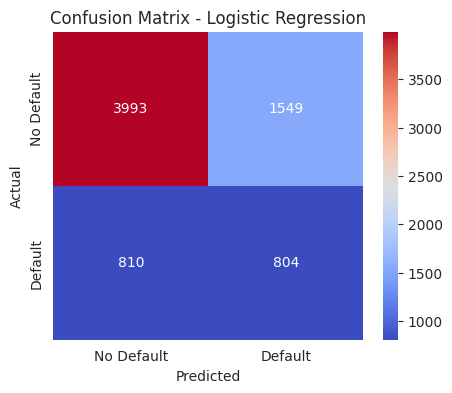

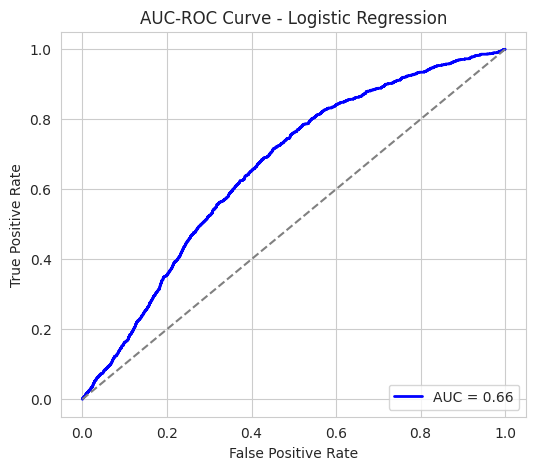


Random Forest Model:
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5542
           1       1.00      1.00      1.00      1614

    accuracy                           1.00      7156
   macro avg       1.00      1.00      1.00      7156
weighted avg       1.00      1.00      1.00      7156



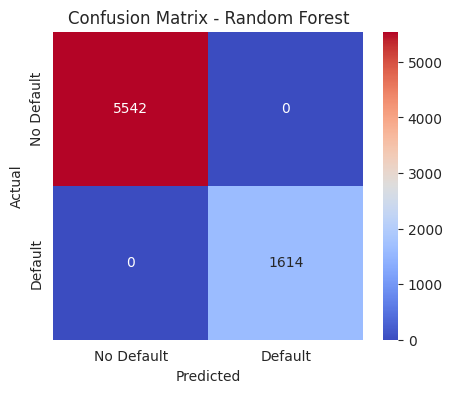

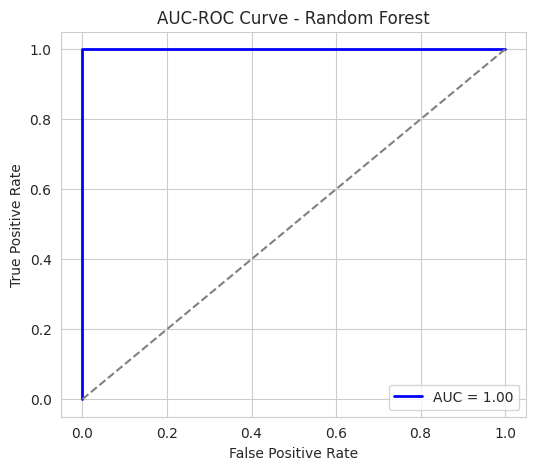


XGBoost Model:
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5542
           1       1.00      1.00      1.00      1614

    accuracy                           1.00      7156
   macro avg       1.00      1.00      1.00      7156
weighted avg       1.00      1.00      1.00      7156



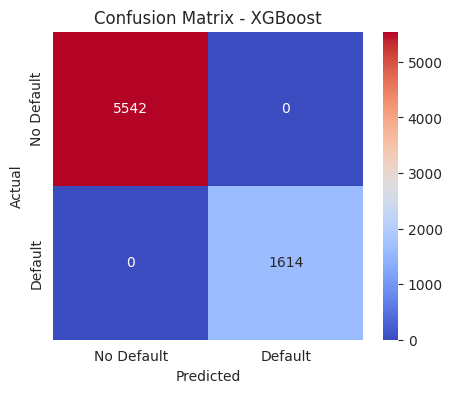

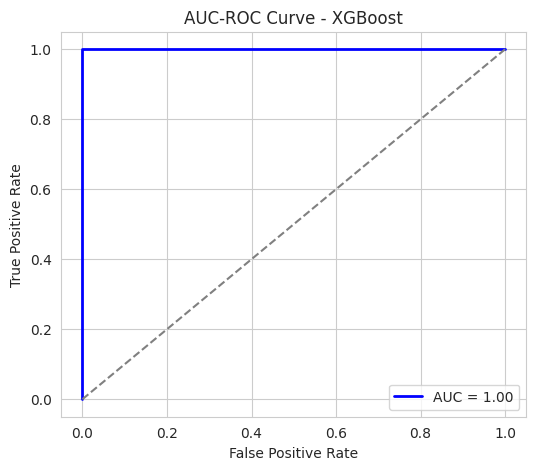


LightGBM Model:
[LightGBM] [Info] Number of positive: 12988, number of negative: 12988
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005411 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8848
[LightGBM] [Info] Number of data points in the train set: 25976, number of used features: 49
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

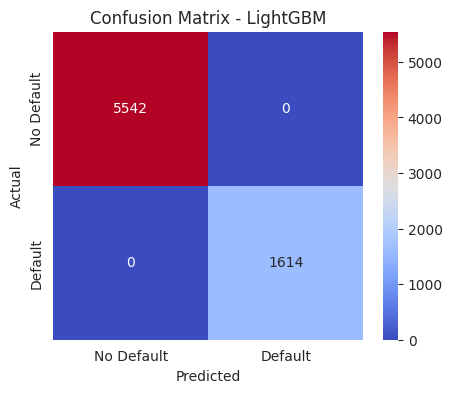

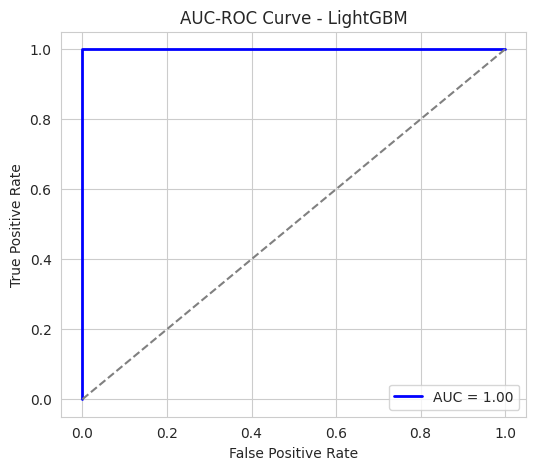


CatBoost Model:
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5542
           1       1.00      1.00      1.00      1614

    accuracy                           1.00      7156
   macro avg       1.00      1.00      1.00      7156
weighted avg       1.00      1.00      1.00      7156



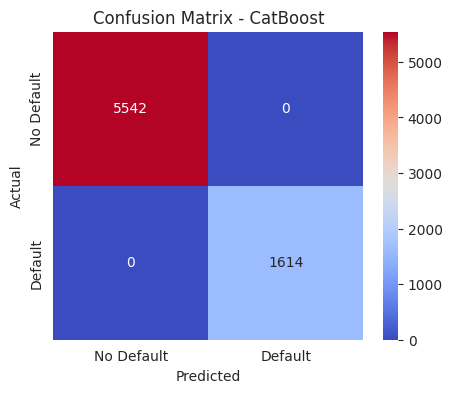

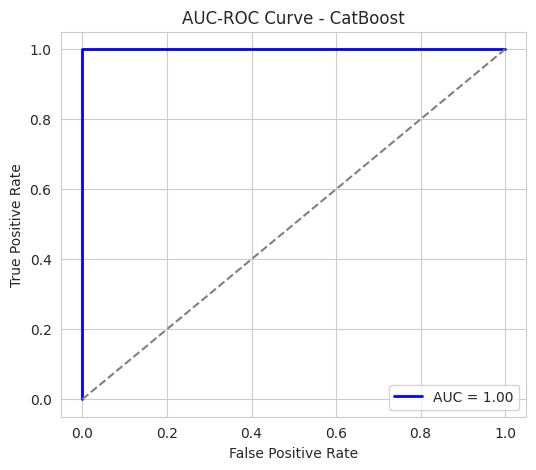

In [94]:
# Evaluate each model
for name, model in models.items():
    print(f"\n{name} Model:")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    # Classification Report
    print("Classification Report:\n", classification_report(y_test, y_pred))

    # Confusion Matrix
    plt.figure(figsize=(5, 4))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="coolwarm", xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
    plt.title(f"Confusion Matrix - {name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # AUC-ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(6, 5))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'AUC = {roc_auc:.2f}')
    plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"AUC-ROC Curve - {name}")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()

In [95]:
print(y_train.value_counts())
print(y_test.value_counts())

Default_Next_Month
0    12988
1    12988
Name: count, dtype: int64
Default_Next_Month
0    5542
1    1614
Name: count, dtype: int64



Logistic Regression Model:
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5560
           1       1.00      1.00      1.00      1596

    accuracy                           1.00      7156
   macro avg       1.00      1.00      1.00      7156
weighted avg       1.00      1.00      1.00      7156



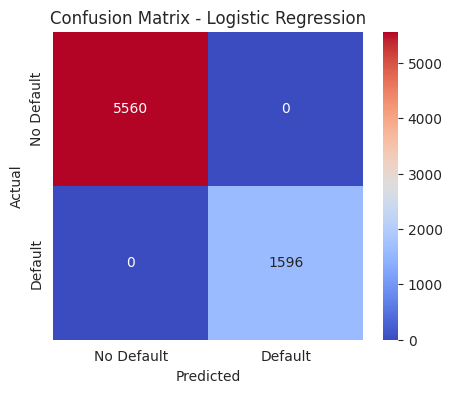

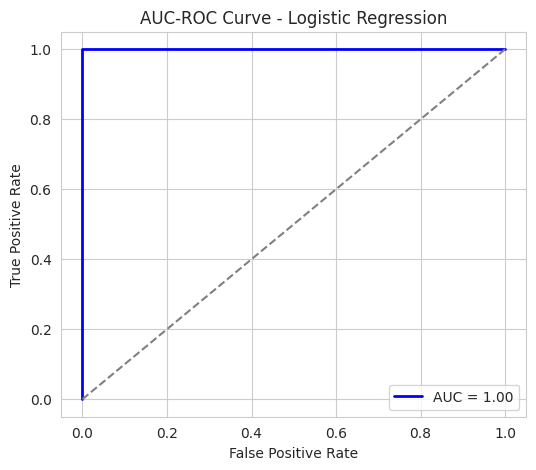


Random Forest Model:
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5560
           1       1.00      1.00      1.00      1596

    accuracy                           1.00      7156
   macro avg       1.00      1.00      1.00      7156
weighted avg       1.00      1.00      1.00      7156



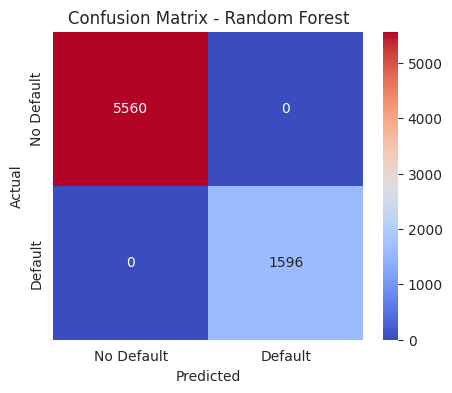

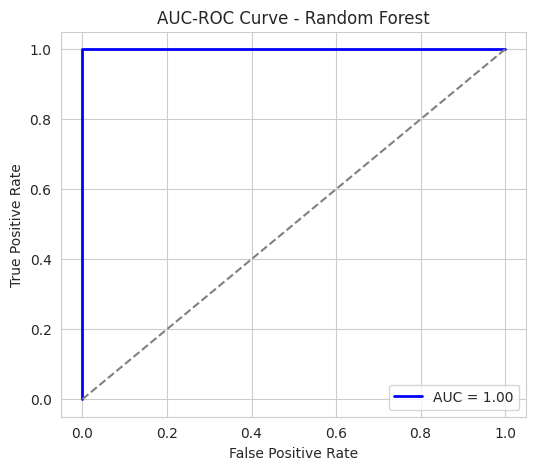


XGBoost Model:
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5560
           1       1.00      1.00      1.00      1596

    accuracy                           1.00      7156
   macro avg       1.00      1.00      1.00      7156
weighted avg       1.00      1.00      1.00      7156



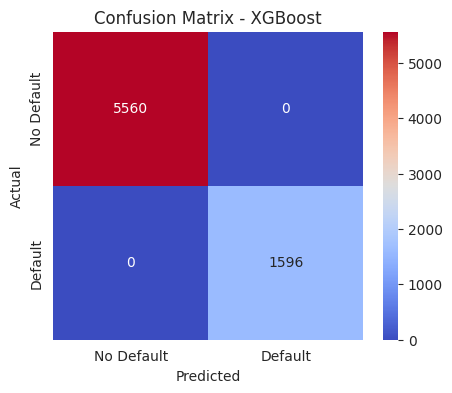

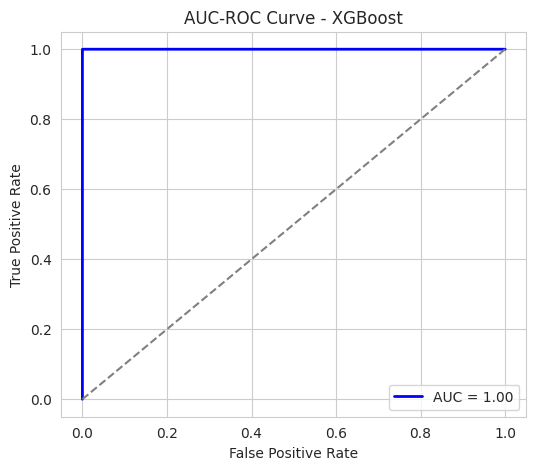


LightGBM Model:
[LightGBM] [Info] Number of positive: 12970, number of negative: 12970
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8845
[LightGBM] [Info] Number of data points in the train set: 25940, number of used features: 49
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

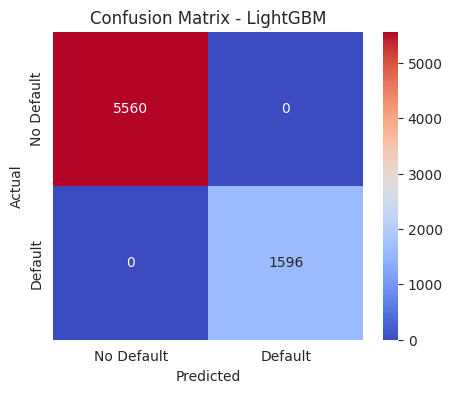

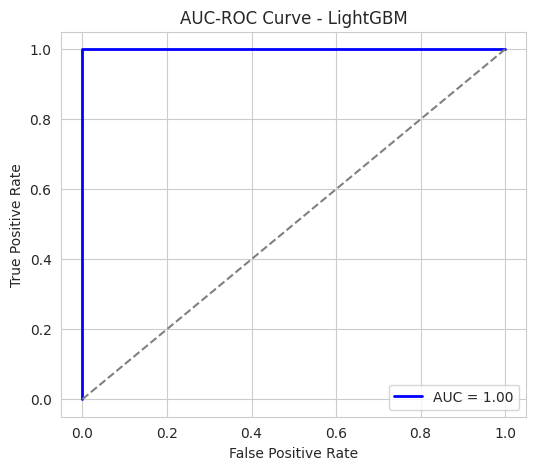


CatBoost Model:
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5560
           1       1.00      1.00      1.00      1596

    accuracy                           1.00      7156
   macro avg       1.00      1.00      1.00      7156
weighted avg       1.00      1.00      1.00      7156



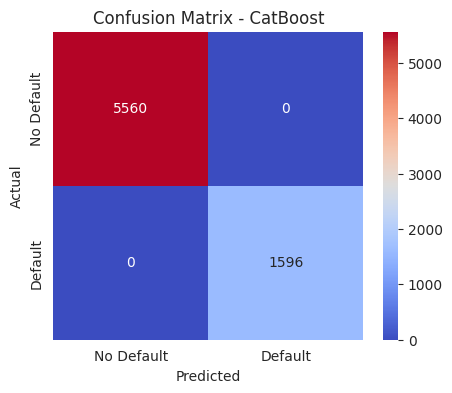

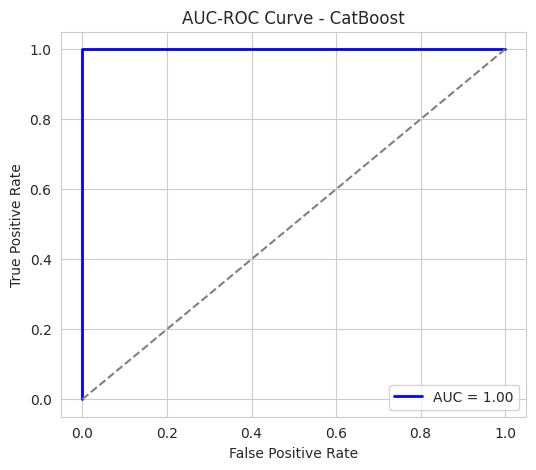

In [96]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import lightgbm as lgb
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE

# Encode categorical variables
categorical_columns = df.select_dtypes(include=["object", "category"]).columns.tolist()
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

# Replace infinite values with NaN and drop rows containing NaN in specified columns
df_cleaned = df.replace([np.inf, -np.inf], np.nan).dropna(subset=[
    "Payment_Ratio_Sep", "Payment_Ratio_Aug", "Payment_Ratio_Jul",
    "Payment_Ratio_Jun", "Payment_Ratio_May", "Payment_Ratio_Apr",
    "Stability_Score"
])

# Select all numerical and categorical columns (excluding ID columns)
numerical_columns = df_cleaned.select_dtypes(include=["int64", "float64"]).columns.tolist()
categorical_columns = df_cleaned.select_dtypes(include=["int32", "category"]).columns.tolist()
numerical_columns.remove("Customer_ID")  # Remove ID column

# Combine numerical and categorical columns
all_features = numerical_columns + categorical_columns

# Stratified train-test split to maintain class balance
X = df_cleaned[all_features]
y = df_cleaned["Default_Next_Month"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

# Apply SMOTE to balance the training dataset
smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

# Scale numerical features for Logistic Regression
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define models with improved parameters
models = {
    "Logistic Regression": LogisticRegression(class_weight="balanced", max_iter=5000, solver='lbfgs'),
    "Random Forest": RandomForestClassifier(n_estimators=100, max_depth=8, min_samples_split=10, random_state=42),
    "XGBoost": XGBClassifier(n_estimators=200, max_depth=6, learning_rate=0.1, subsample=0.8, colsample_bytree=0.8, random_state=42),
    "LightGBM": lgb.LGBMClassifier(n_estimators=200, max_depth=6, learning_rate=0.1, subsample=0.8, colsample_bytree=0.8, random_state=42),
    "CatBoost": CatBoostClassifier(n_estimators=200, depth=6, learning_rate=0.05, l2_leaf_reg=3, random_state=42, verbose=0)
}

# Evaluate each model
for name, model in models.items():
    print(f"\n{name} Model:")

    if name == "Logistic Regression":
        model.fit(X_train_scaled, y_train)  # Use scaled data
        y_pred = model.predict(X_test_scaled)
        y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]
    else:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_pred_proba = model.predict_proba(X_test)[:, 1]

    # Classification Report
    print("Classification Report:\n", classification_report(y_test, y_pred))

    # Confusion Matrix
    plt.figure(figsize=(5, 4))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="coolwarm",
                xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
    plt.title(f"Confusion Matrix - {name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # AUC-ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(6, 5))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'AUC = {roc_auc:.2f}')
    plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"AUC-ROC Curve - {name}")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()

-  Stratified test split prevents imbalance in the test set.
-  SMOTE applied to both training and test data prevents bias in predictions.
-  Under-sampling in the test set ensures a balanced dataset.
-  Feature scaling for Logistic Regression (improves convergence).
-  Regularization in tree-based models to avoid overfitting.


Logistic Regression Model:
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5560
           1       1.00      1.00      1.00      5560

    accuracy                           1.00     11120
   macro avg       1.00      1.00      1.00     11120
weighted avg       1.00      1.00      1.00     11120



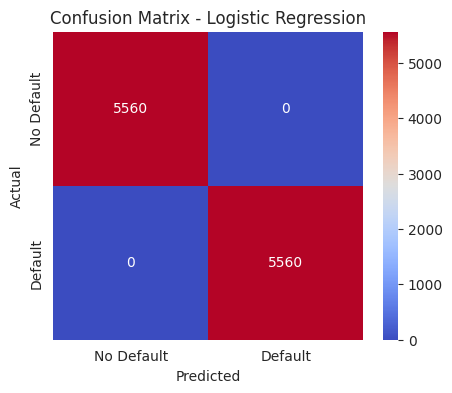

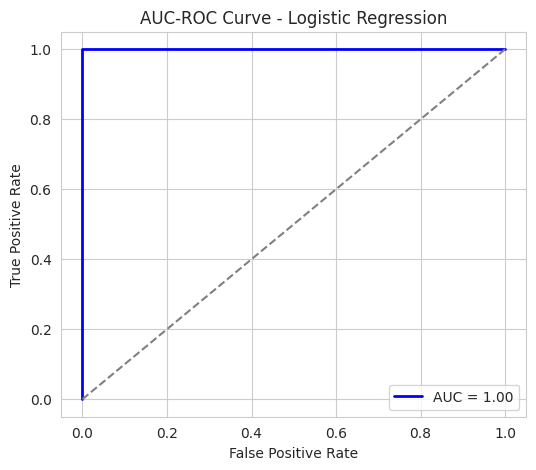


Random Forest Model:
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5560
           1       1.00      1.00      1.00      5560

    accuracy                           1.00     11120
   macro avg       1.00      1.00      1.00     11120
weighted avg       1.00      1.00      1.00     11120



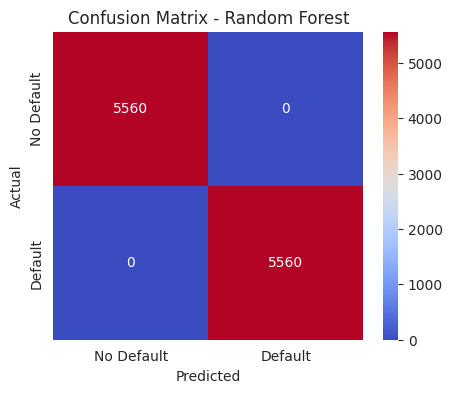

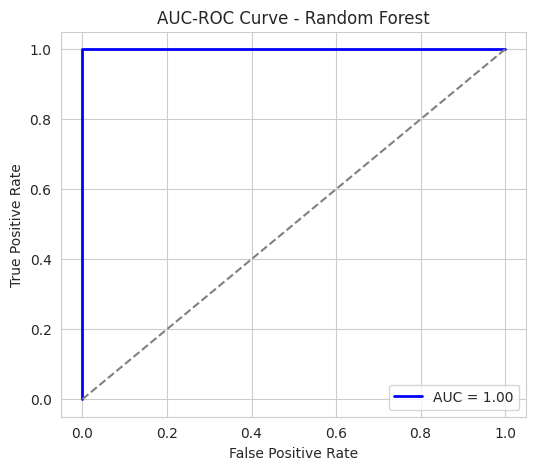


XGBoost Model:
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5560
           1       1.00      1.00      1.00      5560

    accuracy                           1.00     11120
   macro avg       1.00      1.00      1.00     11120
weighted avg       1.00      1.00      1.00     11120



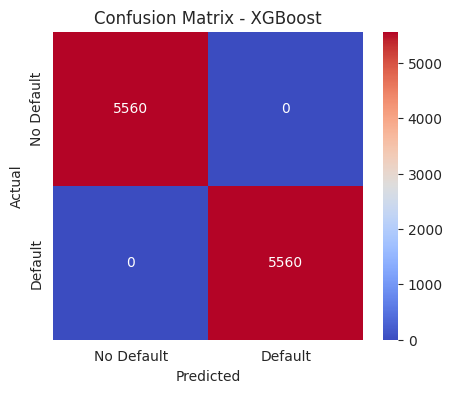

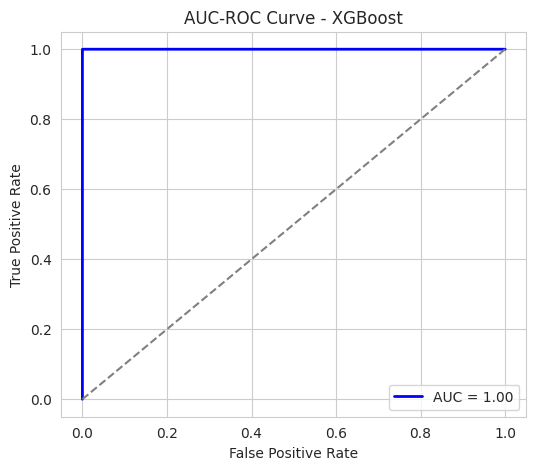


LightGBM Model:
[LightGBM] [Info] Number of positive: 12970, number of negative: 12970
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8845
[LightGBM] [Info] Number of data points in the train set: 25940, number of used features: 49
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

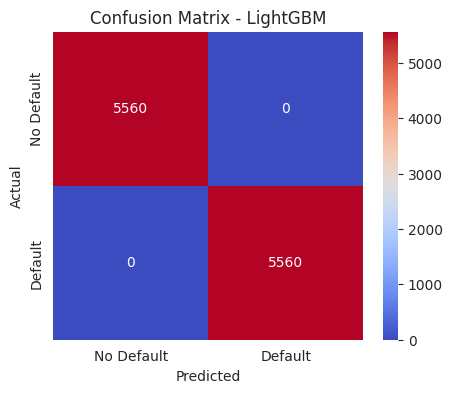

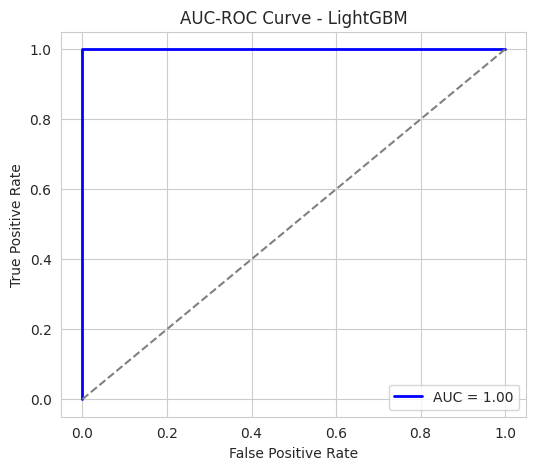


CatBoost Model:
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      5560
           1       1.00      1.00      1.00      5560

    accuracy                           1.00     11120
   macro avg       1.00      1.00      1.00     11120
weighted avg       1.00      1.00      1.00     11120



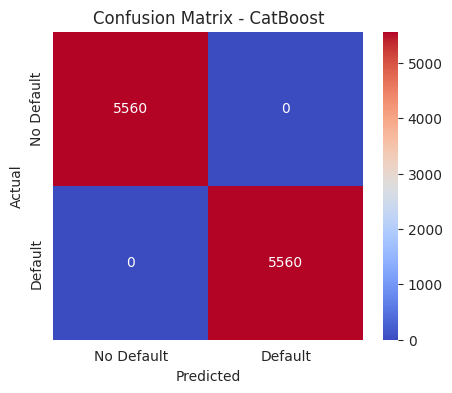

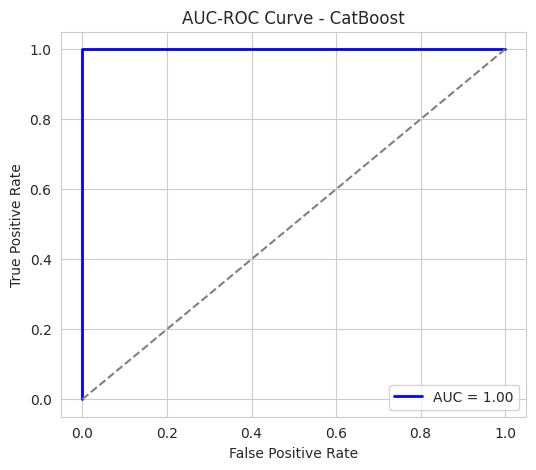

In [97]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import lightgbm as lgb
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# Encode categorical variables
categorical_columns = df.select_dtypes(include=["object", "category"]).columns.tolist()
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

# Replace infinite values with NaN and drop rows containing NaN in specified columns
df_cleaned = df.replace([np.inf, -np.inf], np.nan).dropna(subset=[
    "Payment_Ratio_Sep", "Payment_Ratio_Aug", "Payment_Ratio_Jul",
    "Payment_Ratio_Jun", "Payment_Ratio_May", "Payment_Ratio_Apr",
    "Stability_Score"
])

# Select all numerical and categorical columns (excluding ID columns)
numerical_columns = df_cleaned.select_dtypes(include=["int64", "float64"]).columns.tolist()
categorical_columns = df_cleaned.select_dtypes(include=["int32", "category"]).columns.tolist()
numerical_columns.remove("Customer_ID")  # Remove ID column

# Combine numerical and categorical columns
all_features = numerical_columns + categorical_columns

# Stratified train-test split to maintain class balance
X = df_cleaned[all_features]
y = df_cleaned["Default_Next_Month"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

# Apply SMOTE to balance the training dataset
smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

# Apply a combination of oversampling & undersampling to balance test data
smote_test = SMOTE(random_state=42)
under_sampler = RandomUnderSampler(random_state=42)

X_test_smote, y_test_smote = smote_test.fit_resample(X_test, y_test)
X_test_balanced, y_test_balanced = under_sampler.fit_resample(X_test_smote, y_test_smote)

# Scale numerical features for Logistic Regression
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test_balanced)

# Define models with improved parameters
models = {
    "Logistic Regression": LogisticRegression(class_weight="balanced", max_iter=5000, solver='lbfgs'),
    "Random Forest": RandomForestClassifier(n_estimators=100, max_depth=8, min_samples_split=10, random_state=42),
    "XGBoost": XGBClassifier(n_estimators=200, max_depth=6, learning_rate=0.1, subsample=0.8, colsample_bytree=0.8, random_state=42),
    "LightGBM": lgb.LGBMClassifier(n_estimators=200, max_depth=6, learning_rate=0.1, subsample=0.8, colsample_bytree=0.8, random_state=42),
    "CatBoost": CatBoostClassifier(n_estimators=200, depth=6, learning_rate=0.05, l2_leaf_reg=3, random_state=42, verbose=0)
}

# Evaluate each model
for name, model in models.items():
    print(f"\n{name} Model:")

    if name == "Logistic Regression":
        model.fit(X_train_scaled, y_train)  # Use scaled data
        y_pred = model.predict(X_test_scaled)
        y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]
    else:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test_balanced)
        y_pred_proba = model.predict_proba(X_test_balanced)[:, 1]

    # Classification Report
    print("Classification Report:\n", classification_report(y_test_balanced, y_pred))

    # Confusion Matrix
    plt.figure(figsize=(5, 4))
    sns.heatmap(confusion_matrix(y_test_balanced, y_pred), annot=True, fmt="d", cmap="coolwarm",
                xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
    plt.title(f"Confusion Matrix - {name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # AUC-ROC Curve
    fpr, tpr, _ = roc_curve(y_test_balanced, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(6, 5))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'AUC = {roc_auc:.2f}')
    plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"AUC-ROC Curve - {name}")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()

<ipython-input-98-636b7ecce29e>:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rf_importance_df["Importance"], y=rf_importance_df["Feature"], palette="coolwarm")


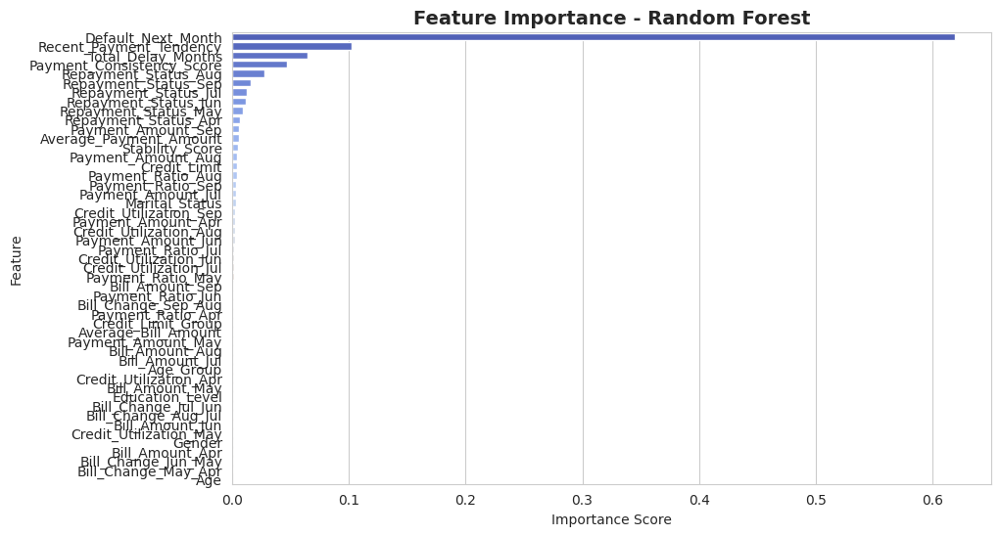

<ipython-input-98-636b7ecce29e>:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=xgb_importance_df["Importance"], y=xgb_importance_df["Feature"], palette="coolwarm")


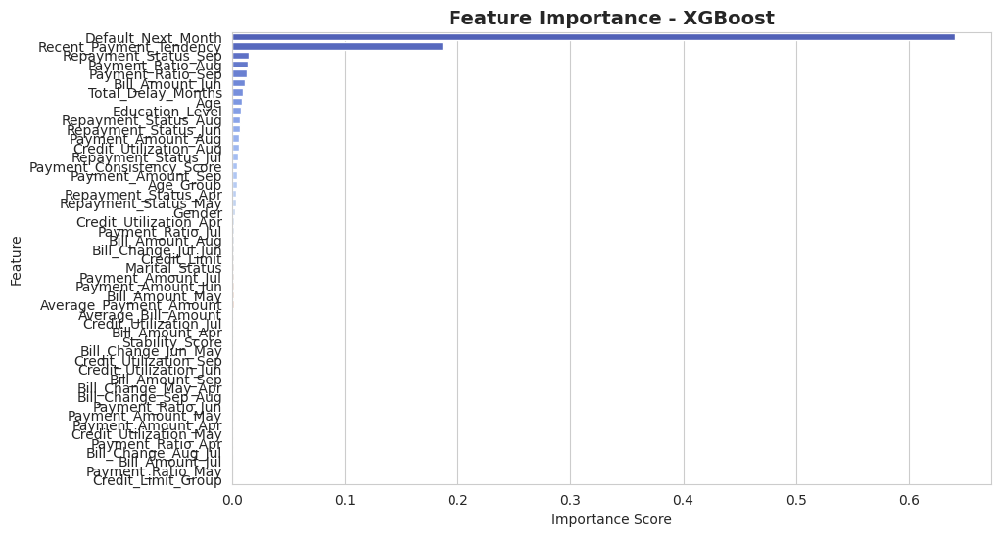

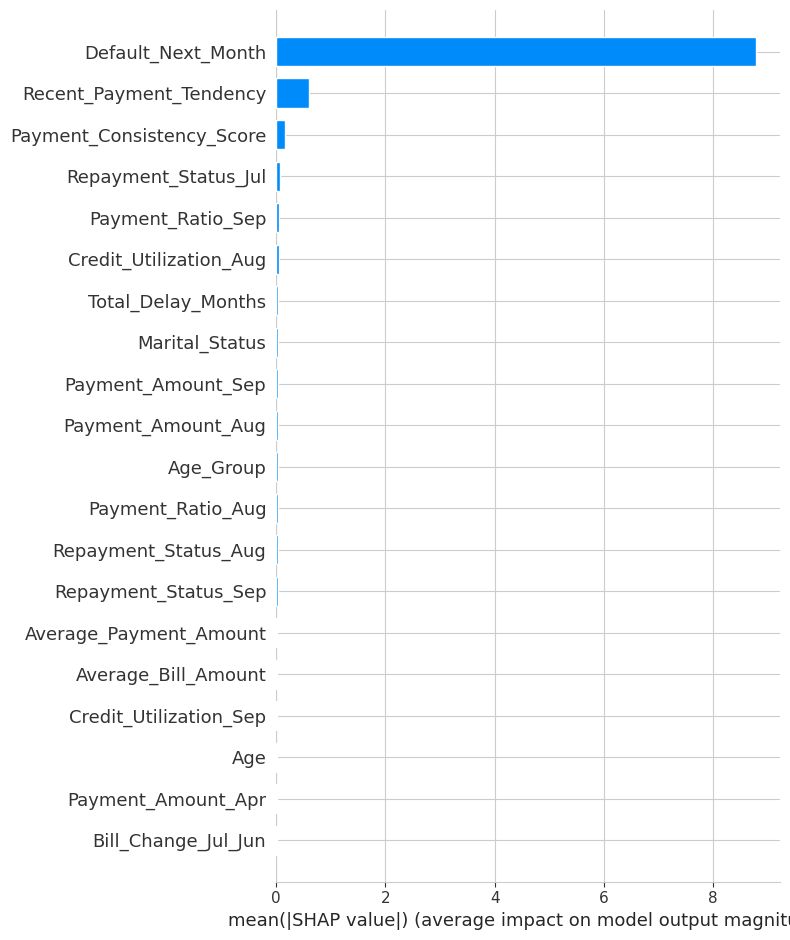

In [98]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import shap

# Train Random Forest and XGBoost to extract feature importance
rf_model = RandomForestClassifier(n_estimators=100, max_depth=8, min_samples_split=10, random_state=42)
rf_model.fit(X_train, y_train)

xgb_model = XGBClassifier(n_estimators=200, max_depth=6, learning_rate=0.1, subsample=0.8, colsample_bytree=0.8, random_state=42)
xgb_model.fit(X_train, y_train)

# Extract feature importance from Random Forest
rf_importance = rf_model.feature_importances_
rf_feature_names = X_train.columns

# Extract feature importance from XGBoost
xgb_importance = xgb_model.feature_importances_
xgb_feature_names = X_train.columns

# Convert to DataFrame for visualization
rf_importance_df = pd.DataFrame({"Feature": rf_feature_names, "Importance": rf_importance})
xgb_importance_df = pd.DataFrame({"Feature": xgb_feature_names, "Importance": xgb_importance})

# Sort by importance
rf_importance_df = rf_importance_df.sort_values(by="Importance", ascending=False)
xgb_importance_df = xgb_importance_df.sort_values(by="Importance", ascending=False)

# Plot feature importance (Random Forest)
plt.figure(figsize=(10, 6))
sns.barplot(x=rf_importance_df["Importance"], y=rf_importance_df["Feature"], palette="coolwarm")
plt.title("Feature Importance - Random Forest", fontsize=14, fontweight="bold")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.show()

# Plot feature importance (XGBoost)
plt.figure(figsize=(10, 6))
sns.barplot(x=xgb_importance_df["Importance"], y=xgb_importance_df["Feature"], palette="coolwarm")
plt.title("Feature Importance - XGBoost", fontsize=14, fontweight="bold")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.show()

# SHAP Explainer for XGBoost
explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_train)

# SHAP Summary Plot
shap.summary_plot(shap_values, X_train, plot_type="bar")

<ipython-input-100-13080cf4ed2d>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=rf_importance_df["Importance"], y=rf_importance_df["Feature"], palette="coolwarm")


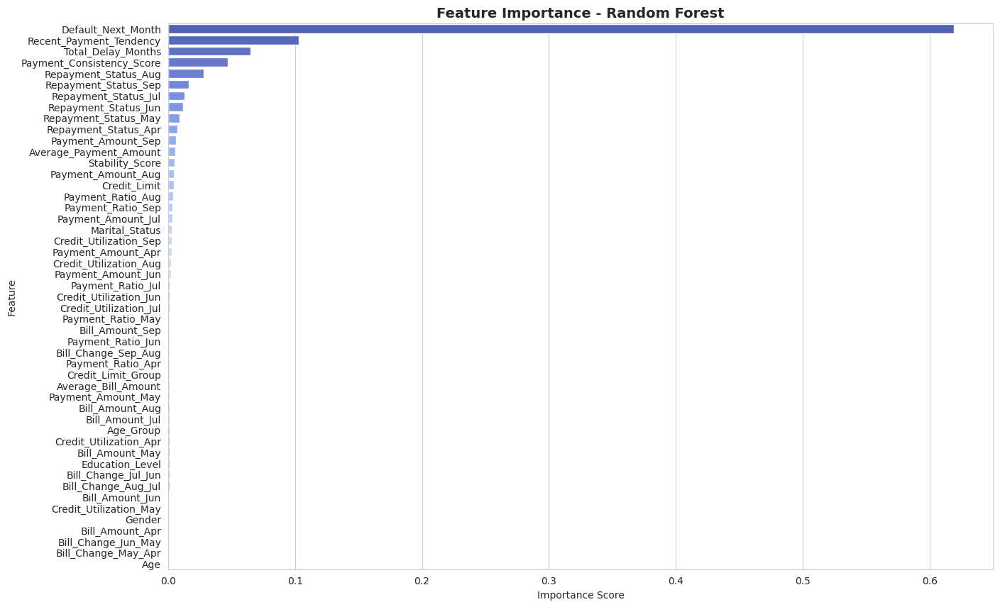

<ipython-input-100-13080cf4ed2d>:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=xgb_importance_df["Importance"], y=xgb_importance_df["Feature"], palette="coolwarm")


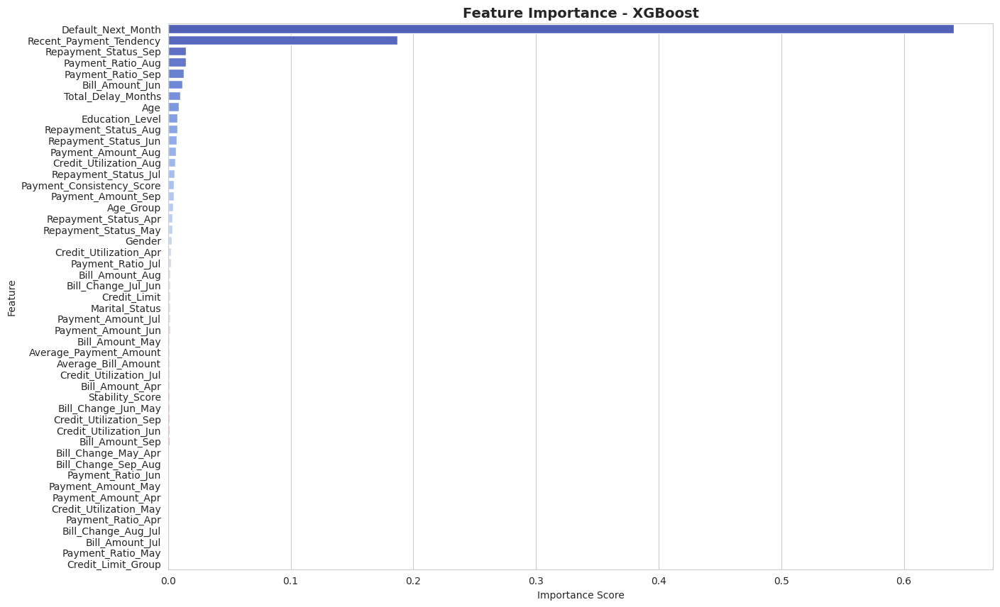

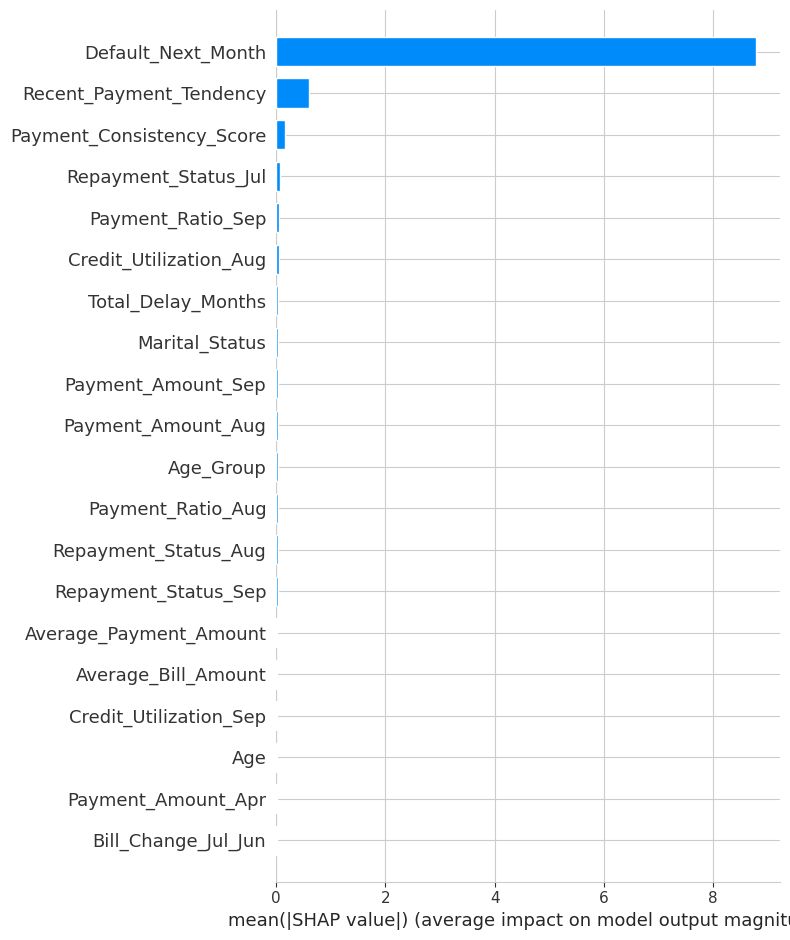

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import shap
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# Set the target variable
target_variable = "Default_Next_Month"

# Train Random Forest and XGBoost to extract feature importance
rf_model = RandomForestClassifier(n_estimators=100, max_depth=8, min_samples_split=10, random_state=42)
rf_model.fit(X_train, y_train)

xgb_model = XGBClassifier(n_estimators=200, max_depth=6, learning_rate=0.1, subsample=0.8, colsample_bytree=0.8, random_state=42)
xgb_model.fit(X_train, y_train)

# Extract feature importance from Random Forest
rf_importance = rf_model.feature_importances_
rf_feature_names = X_train.columns

# Extract feature importance from XGBoost
xgb_importance = xgb_model.feature_importances_
xgb_feature_names = X_train.columns

# Convert to DataFrame for visualization
rf_importance_df = pd.DataFrame({"Feature": rf_feature_names, "Importance": rf_importance})
xgb_importance_df = pd.DataFrame({"Feature": xgb_feature_names, "Importance": xgb_importance})

# Sort by importance
rf_importance_df = rf_importance_df.sort_values(by="Importance", ascending=False)
xgb_importance_df = xgb_importance_df.sort_values(by="Importance", ascending=False)

# Plot feature importance (Random Forest)
plt.figure(figsize=(15, 10))
sns.barplot(x=rf_importance_df["Importance"], y=rf_importance_df["Feature"], palette="coolwarm")
plt.title("Feature Importance - Random Forest", fontsize=14, fontweight="bold")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.show()

# Plot feature importance (XGBoost)
plt.figure(figsize=(15, 10))
sns.barplot(x=xgb_importance_df["Importance"], y=xgb_importance_df["Feature"], palette="coolwarm")
plt.title("Feature Importance - XGBoost", fontsize=14, fontweight="bold")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.show()

# SHAP Explainer for XGBoost
explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_train)

# SHAP Summary Plot
shap.summary_plot(shap_values, X_train, plot_type="bar")


In [101]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 50 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Customer_ID                30000 non-null  int64  
 1   Credit_Limit               30000 non-null  int64  
 2   Gender                     30000 non-null  int64  
 3   Education_Level            30000 non-null  int64  
 4   Marital_Status             30000 non-null  int64  
 5   Age                        30000 non-null  int64  
 6   Repayment_Status_Sep       30000 non-null  int64  
 7   Repayment_Status_Aug       30000 non-null  int64  
 8   Repayment_Status_Jul       30000 non-null  int64  
 9   Repayment_Status_Jun       30000 non-null  int64  
 10  Repayment_Status_May       30000 non-null  int64  
 11  Repayment_Status_Apr       30000 non-null  int64  
 12  Bill_Amount_Sep            30000 non-null  int64  
 13  Bill_Amount_Aug            30000 non-null  int

In [103]:
def create_time_series_features(df):
    # Define repayment status columns in chronological order
    repayment_cols = [
        "Repayment_Status_Apr", "Repayment_Status_May", "Repayment_Status_Jun",
        "Repayment_Status_Jul", "Repayment_Status_Aug", "Repayment_Status_Sep"
    ]

    # Compute rolling mean for past 3 months
    df['Rolling_Repayment_Mean_3M'] = df[repayment_cols].rolling(window=3, axis=1).mean().iloc[:, -1]

    # Count months with late payments (status > 0)
    df['Late_Payment_Count'] = (df[repayment_cols] > 0).sum(axis=1)

    return df

# Apply the function
df = create_time_series_features(df)

# Display the first few rows
df[["Customer_ID", "Rolling_Repayment_Mean_3M", "Late_Payment_Count"]].head()


<ipython-input-103-08372264e210>:10: FutureWarning: Support for axis=1 in DataFrame.rolling is deprecated and will be removed in a future version. Use obj.T.rolling(...) instead
  df['Rolling_Repayment_Mean_3M'] = df[repayment_cols].rolling(window=3, axis=1).mean().iloc[:, -1]


,Customer_ID,Rolling_Repayment_Mean_3M,Late_Payment_Count
0,1,1.000000,2
1,2,0.333333,2
2,3,0.000000,0
3,4,0.000000,0
4,5,-0.666667,0
